In [1]:
import torch
import torch.nn as nn
import snntorch as snn
from snntorch import surrogate, functional as SF, utils
from torch.utils.data import DataLoader
import tonic
import tonic.transforms as transforms
import tonic.datasets as td
import numpy as np
import numpy.lib.recfunctions as rf
import matplotlib.pyplot as plt
from IPython.display import HTML

In [2]:
train_dataset = td.DVSGesture(save_to="./data", train=True)
test_dataset = td.DVSGesture(save_to="./data", train=False)

In [3]:
DVS_GESTURE_CLASSES = [
        "Hand clapping",
        "Right hand wave",
        "Left hand wave",
        "Right arm cw",  # clockwise
        "Right arm ccw",  # counter-clockwise
        "Left arm cw",
        "Left arm ccw",
        "Arm roll",
        "Air drums",
        "Air guitar",
        "Other gestures",
    ]

In [4]:
def to_frames(events):
    frame_transform = tonic.transforms.ToFrame(sensor_size=tonic.datasets.DVSGesture.sensor_size, n_time_bins=120)
    return frame_transform(events)

In [9]:
events, label = train_dataset[9]
frames = to_frames(events)
print("event index 0",events[0])
print("Train dataset contains", len(train_dataset), "samples.")
print("Test dataset contains", len(test_dataset), "samples.")
print("There are", len(events), "events in the first sample.")
print("A single event:", events[0], "as (x-pos, y-pos, polarity, timestamp).")
print ("Frames shape:",frames.shape,".")

event index 0 (82, 92, True, 23)
Train dataset contains 1077 samples.
Test dataset contains 264 samples.
There are 332531 events in the first sample.
A single event: (82, 92, True, 23) as (x-pos, y-pos, polarity, timestamp).
Frames shape: (120, 2, 128, 128) .


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..23.0].


Gesture: Hand clapping (Class 0)


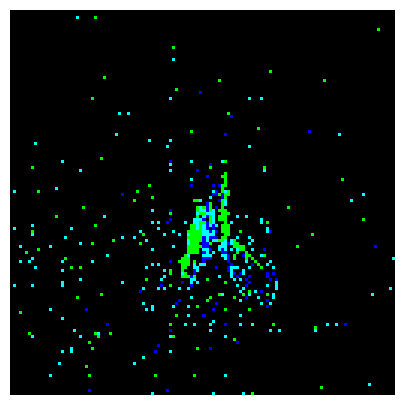

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..23.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..23.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..16.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..16.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].


Gesture: Right hand wave (Class 1)


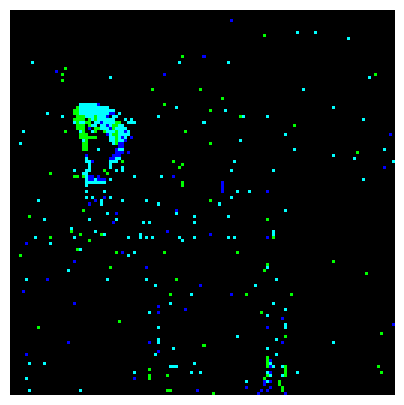

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..28.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..28.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..14.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..19.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..15.0].


Gesture: Left hand wave (Class 2)


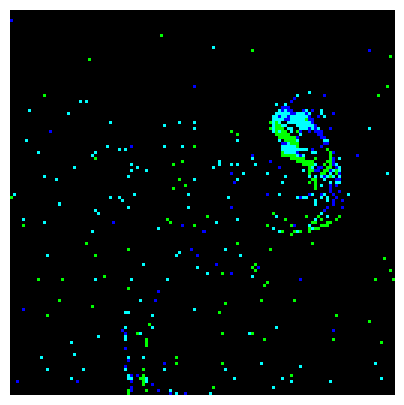

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..15.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..15.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..38.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..15.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..31.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..30.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].


Gesture: Right arm cw (Class 3)


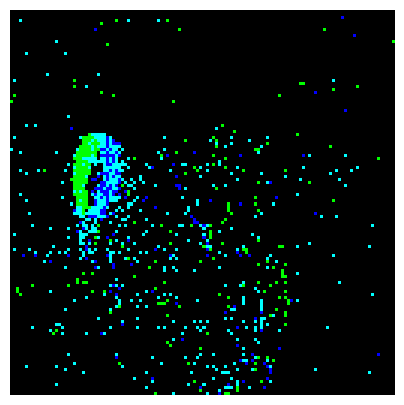

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..31.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..43.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..38.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].


Gesture: Right arm ccw (Class 4)


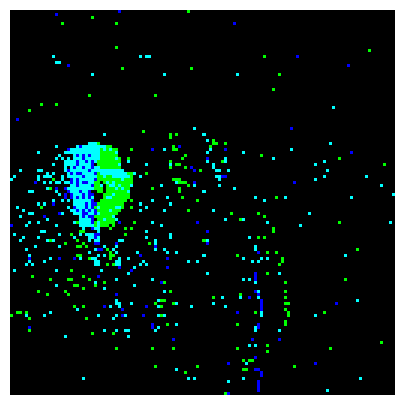

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..19.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..34.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..22.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].


Gesture: Left arm cw (Class 5)


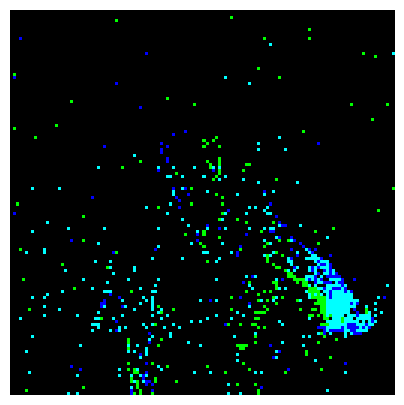

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..14.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..16.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..23.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].


Gesture: Left arm ccw (Class 6)


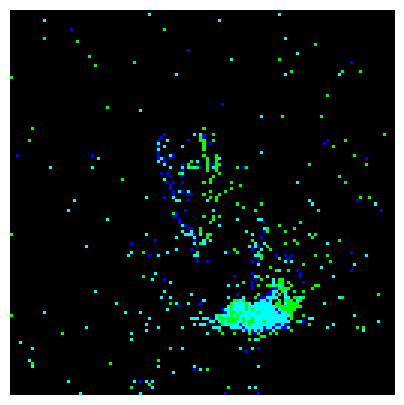

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..18.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..17.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..33.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..24.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..26.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].


Gesture: Arm roll (Class 7)


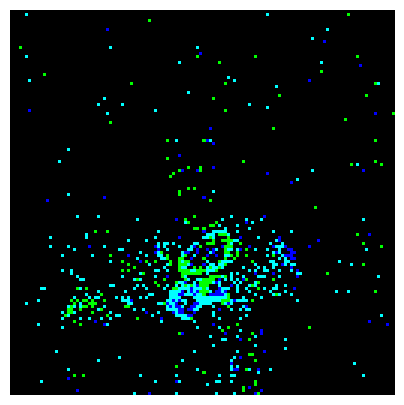

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..42.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..36.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..23.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..20.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].


Gesture: Air drums (Class 8)


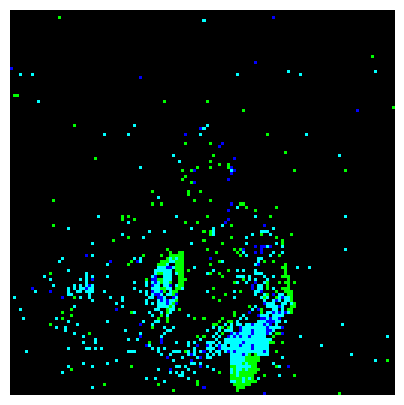

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..30.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..24.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..41.0].


Gesture: Air guitar (Class 9)


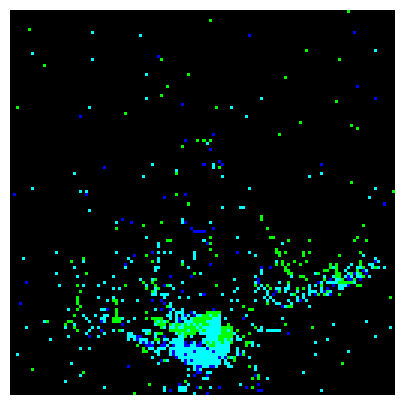

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..41.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..41.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..25.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..21.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..33.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..48.0].
Clipping input data to the valid range for imshow with RGB data ([0..

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..35.0].


Gesture: Other gestures (Class 10)


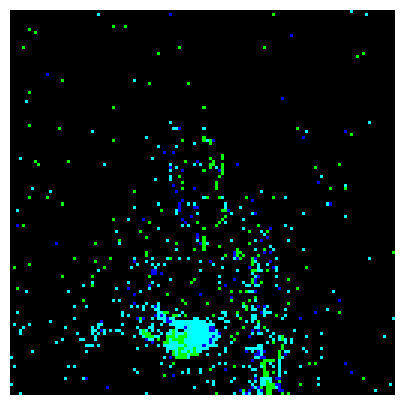

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..35.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..35.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..69.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..42.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..27.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..35.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..26.0].
Clipping input data to the valid range for imshow with RGB data ([0..

In [15]:
sampled_frames = {}
for i in range(len(train_dataset)):
    events, label = train_dataset[i]
    if label not in sampled_frames:
        sampled_frames[label] = to_frames(events)
    if len(sampled_frames) == 11:
        break

#for cid in []:
for cid in sorted(sampled_frames.keys()):
    frames = sampled_frames[cid]
    name = DVS_GESTURE_CLASSES[cid]
    print(f"Gesture: {name} (Class {cid})")
    ani = tonic.utils.plot_animation(frames)
    ani.save(f"{cid}_{name.replace(' ', '_')}.gif", writer='pillow', fps=30)
    display(HTML(ani.to_jshtml())) 

In [11]:
w,h=32,32
n_frames=32
debug = False

transformer = tonic.transforms.Compose([
    transforms.Denoise(filter_time=10000),
    transforms.Downsample(sensor_size=tonic.datasets.DVSGesture.sensor_size, target_size=(w,h)),
    transforms.ToFrame(sensor_size=(w,h,2), n_time_bins=n_frames),
])

train_trans_data = tonic.datasets.DVSGesture(save_to='./data', transform=transformer, train=True)
test_trans_data = tonic.datasets.DVSGesture(save_to='./data', transform=transformer, train=False)
cached_train = train_trans_data
cached_test = test_trans_data

print("There are", len(cached_train[0][0]), cached_train[0][0].shape, "events in the first sample.")
print ("Frames shape:",frames.shape,".")

There are 32 (32, 2, 32, 32) events in the first sample.
Frames shape: (120, 2, 128, 128) .


Gesture: Hand clapping (Class 0)


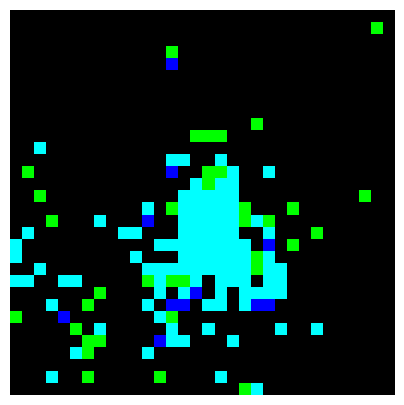

Gesture: Right hand wave (Class 1)


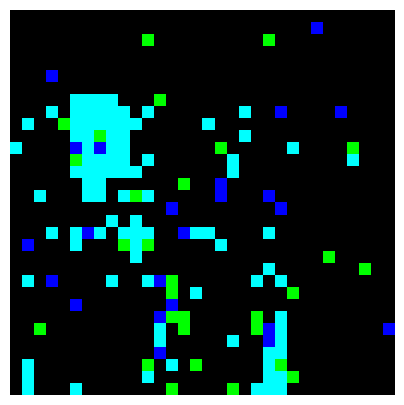

Gesture: Left hand wave (Class 2)


/opt/anaconda3/lib/python3.12/site-packages/matplotlib/animation.py:872: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


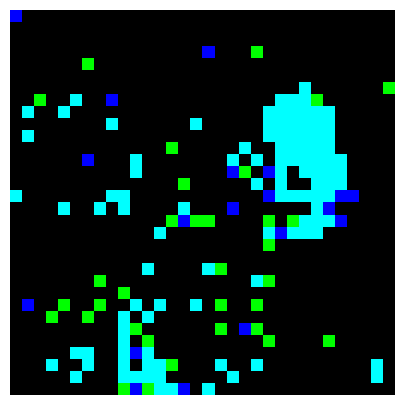

Gesture: Right arm cw (Class 3)


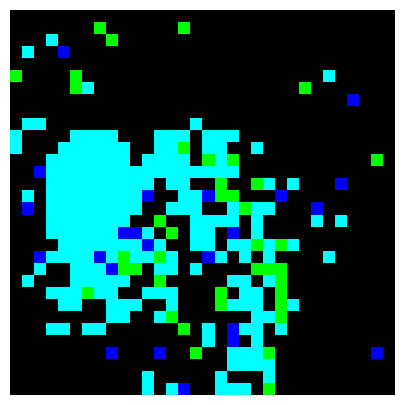

Gesture: Right arm ccw (Class 4)


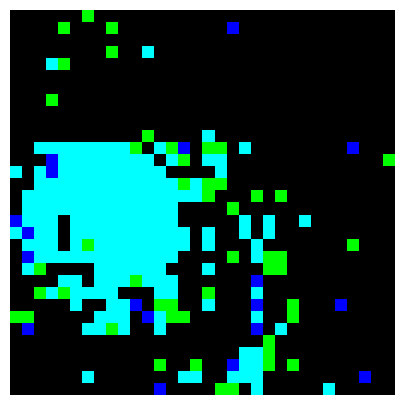

Gesture: Left arm cw (Class 5)


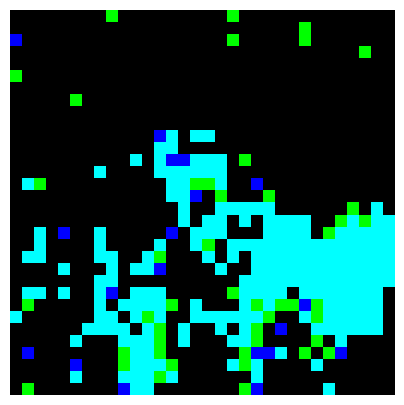

Gesture: Left arm ccw (Class 6)


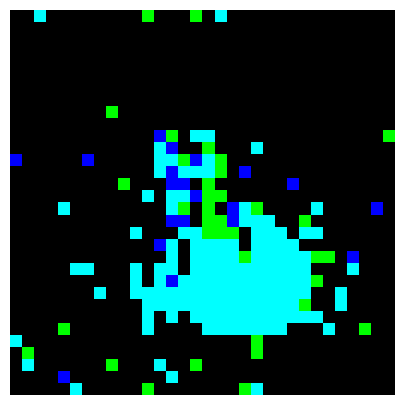

Gesture: Arm roll (Class 7)


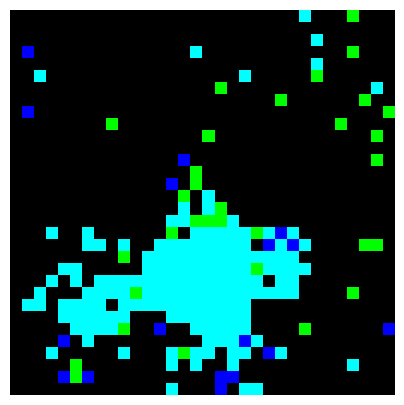

Gesture: Air drums (Class 8)


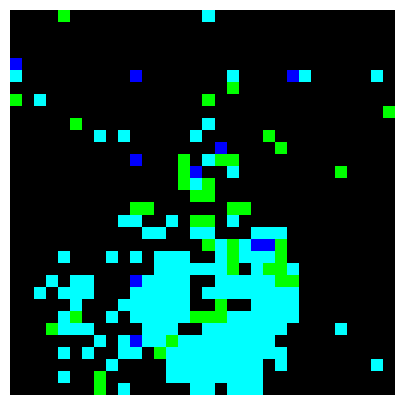

Gesture: Air guitar (Class 9)


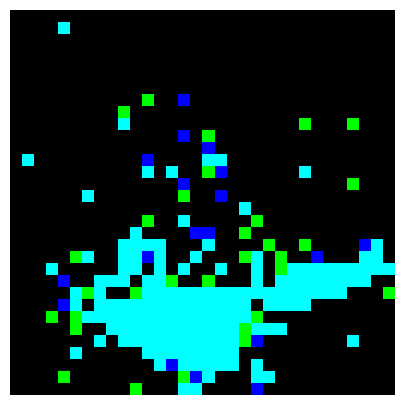

Gesture: Other gestures (Class 10)


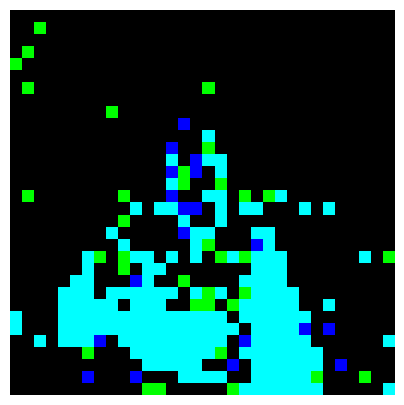

In [17]:
sampled_frames = {}
for i in range(len(cached_train)):
    events, label = cached_train[i]
    if label not in sampled_frames:
        sampled_frames[label] = np.clip(events.astype(np.float32), 0.0, 1.0)
    if len(sampled_frames) == 11:
        break
#for cid in []:
for cid in sorted(sampled_frames.keys()):
    frames = sampled_frames[cid]
    name = DVS_GESTURE_CLASSES[cid]
    print(f"Gesture: {name} (Class {cid})")
    ani = tonic.utils.plot_animation(frames)
    #ani.save(f"{cid}_{name.replace(' ', '_')}_downsampled.gif", writer='pillow', fps=30)
    #display(HTML(ani.to_jshtml())) 

In [13]:
print(torch.backends.mps.is_available())
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu") # Use Metal GPU
x = torch.randn(5, 5).to(device)
print(x.device)  # Should print "mps"

True
mps:0


In [15]:
grad = surrogate.fast_sigmoid(slope=25)
beta = 0.5
input_dim = 2 * w * h
net = None
optimizer = None
loss_fn = None

In [17]:
grad = snn.surrogate.fast_sigmoid(slope=25)
beta = 0.5

def build_model(dropout_rate):
    return nn.Sequential(
        nn.Conv2d(2, 12, 5),
        snn.Leaky(beta=beta, spike_grad=grad, init_hidden=True),
        
        nn.Conv2d(12, 24, 5),
        nn.MaxPool2d(2),
        #nn.Dropout(dropout_rate),
        snn.Leaky(beta=beta, spike_grad=grad, init_hidden=True),
        
        nn.Conv2d(24, 32, 5),
        nn.MaxPool2d(2),
        #nn.Dropout(dropout_rate),
        snn.Leaky(beta=beta, spike_grad=grad, init_hidden=True),
        
        nn.Flatten(),
        nn.Dropout(dropout_rate),
        nn.Linear(512, 11),
        snn.Leaky(beta=beta, spike_grad=grad, init_hidden=True, output=True)
    ).to(device)

In [19]:
def forward_pass(net, data):
    spk_rec = []
    snn.utils.reset(net) 
    for step in range(data.size(0)):
        spk_out, mem_out = net(data[step])
        spk_rec.append(spk_out)
    return torch.stack(spk_rec)

In [21]:
def validate_model():
    global net
    correct, total = 0, 0
    net.eval()
    with torch.no_grad():
        for batch, (data, targets) in enumerate(test_loader):
            data, targets = data.to(device), targets.to(device)
            spk_rec = forward_pass(net, data)
            correct += SF.accuracy_rate(spk_rec, targets) * data.shape[0]
            total += data.shape[0]
    return correct / total

In [23]:
def plot_acc(tr,ts,ls):
    fig, axes = plt.subplots(1, 3, figsize=(18,4))
    # Plot Train Accuracy
    axes[0].plot(tr)
    axes[0].set_title("Train Set Accuracy")
    axes[0].set_xlabel("Iteration")
    axes[0].set_ylabel("Accuracy")

    # Plot Test Accuracy
    axes[1].plot(ts)
    axes[1].set_title("Test Set Accuracy")
    axes[1].set_xlabel("Iteration")
    axes[1].set_ylabel("Accuracy")
    
    # Plot Training Loss
    axes[2].plot(ls)
    axes[2].set_title("Loss History")
    axes[2].set_xlabel("Iteration")
    axes[2].set_ylabel("Loss")
    
    plt.show()

In [25]:
train_loader = DataLoader(cached_train, batch_size=64, shuffle=True, drop_last=True,
                          collate_fn=tonic.collation.PadTensors(batch_first=False))
test_loader = DataLoader(cached_test, batch_size=32, shuffle=True, drop_last=True,
                         collate_fn=tonic.collation.PadTensors(batch_first=False))

In [27]:
def train_model(epochs):
    global net, optimizer, loss_fn, cnt
    loss_hist = []
    acc_hist = []
    test_acc_hist = []
    for epoch in range(epochs):
        total_loss, total_acc = 0, 0
        ls,tr = 0, 0
        for batch, (data, targets) in enumerate(train_loader):
            data, targets = data.to(device), targets.to(device)

            net.train()
            spk_rec = forward_pass(net, data)
            loss = loss_fn(spk_rec, targets)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_acc += SF.accuracy_rate(spk_rec, targets)
            ls = loss.item()
            loss_hist.append(ls)
            tr = SF.accuracy_rate(spk_rec, targets)
            acc_hist.append(tr)
            print(f"{tr*100:.2f},{ls:.2f}")
            cnt+=1
        avg_train_loss = total_loss / len(train_loader)
        avg_train_acc = total_acc / len(train_loader)
        test_acc = validate_model()
        test_acc_hist.append(test_acc)
        
        print(f"Epoch {epoch} - Train Loss: {ls:.2f} | Train Acc: {tr*100:.2f}% | Test Acc: {test_acc*100:.2f}%")
        print(f"Avg Train Loss: {avg_train_loss:.2f} | Avg Train Acc: {avg_train_acc*100:.2f}%")

    return acc_hist, test_acc_hist, loss_hist, avg_train_acc, test_acc, avg_train_loss
    

In [29]:
def sweepTrain(epochs):
    global net, optimizer, loss_fn
    for i,dr in enumerate(dropouts):
        for j,lr in enumerate(lrs):
            print(f"Training with Dropout: {dr}, Learning Rate: {lr}")
            net = build_model(dr)
            optimizer = torch.optim.Adam(net.parameters(), lr=lr, betas=(0.9, 0.999))
            loss_fn = SF.ce_count_loss()
            #loss_fn = SF.mse_count_loss(correct_rate=0.8, incorrect_rate=0.2)
            
            tr, ts, ls, avtr, avts, avls = train_model(epochs)
            
            results.append({
                'dropout': dr,
                'lr': lr,
                'avg_train_acc': avtr,
                'avg_train_loss': avls,
                'avg_test_acc': avts,
                'train_accs': tr,
                'test_accs': ts,
                'loss_list': ls
            })
            print(f"Plotting model with Dropout: {dr}, Learning Rate: {lr}")
            plot_acc(tr, ts, ls)

In [70]:
results = []
dropouts = [0.2, 0.25, 0.3]
lrs = [0.003, 0.002, 0.001]
cnt=0

Training with Dropout: 0.2, Learning Rate: 0.003
6.25,2.40
7.81,2.40
9.38,2.40
10.94,2.37
14.06,3.27
14.06,2.38
4.69,2.41
12.50,2.40
9.38,2.40
9.38,2.40
12.50,2.41
10.94,2.51
15.62,2.40
4.69,2.40
14.06,2.32
26.56,2.71
Epoch 0 - Train Loss: 2.71 | Train Acc: 26.56% | Test Acc: 17.58%
Avg Train Loss: 2.47 | Avg Train Acc: 11.43%
21.88,2.16
7.81,2.39
14.06,2.32
3.12,2.38
14.06,2.36
20.31,2.29
20.31,2.23
37.50,1.98
21.88,2.35
21.88,2.40
34.38,2.00
25.00,2.38
28.12,2.11
29.69,1.92
28.12,1.96
25.00,2.03
Epoch 1 - Train Loss: 2.03 | Train Acc: 25.00% | Test Acc: 20.31%
Avg Train Loss: 2.20 | Avg Train Acc: 22.07%
28.12,1.99
31.25,1.85
21.88,2.13
35.94,1.83
31.25,1.99
42.19,1.76
31.25,2.37
37.50,1.71
43.75,1.70
32.81,1.91
42.19,1.77
35.94,1.71
48.44,1.51
37.50,1.94
31.25,1.78
32.81,1.76
Epoch 2 - Train Loss: 1.76 | Train Acc: 32.81% | Test Acc: 28.91%
Avg Train Loss: 1.86 | Avg Train Acc: 35.25%
46.88,1.55
45.31,1.72
50.00,1.67
48.44,1.73
48.44,1.45
37.50,1.62
48.44,1.54
43.75,1.58
42.19,1.63


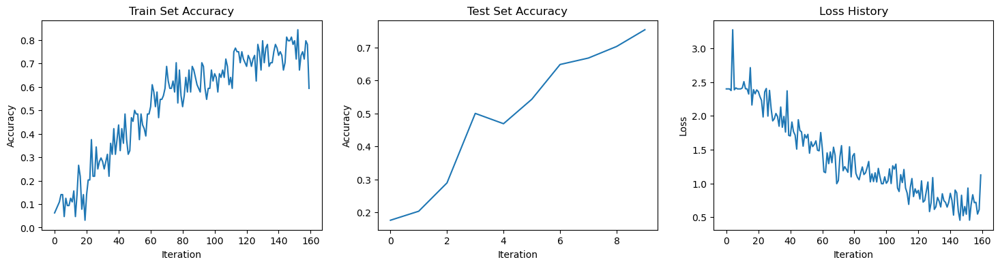

Training with Dropout: 0.2, Learning Rate: 0.002
9.38,2.40
7.81,2.40
6.25,2.40
20.31,2.57
9.38,2.40
10.94,2.40
6.25,2.40
12.50,2.40
9.38,2.40
7.81,2.40
6.25,2.40
12.50,2.40
18.75,2.36
17.19,3.11
10.94,2.40
3.12,2.40
Epoch 0 - Train Loss: 2.40 | Train Acc: 3.12% | Test Acc: 8.98%
Avg Train Loss: 2.45 | Avg Train Acc: 10.55%
10.94,2.40
10.94,2.40
9.38,2.40
3.12,2.40
14.06,2.40
15.62,2.40
6.25,2.40
10.94,2.40
20.31,2.40
3.12,2.40
4.69,2.40
7.81,2.40
9.38,2.40
6.25,2.40
9.38,2.40
6.25,2.40
Epoch 1 - Train Loss: 2.40 | Train Acc: 6.25% | Test Acc: 8.98%
Avg Train Loss: 2.40 | Avg Train Acc: 9.28%
9.38,2.40
7.81,2.40
3.12,2.40
12.50,2.40
6.25,2.40
9.38,2.40
7.81,2.40
15.62,2.40
6.25,2.40
10.94,2.40
10.94,2.40
7.81,2.40
10.94,2.40
10.94,2.40
10.94,2.40
6.25,2.40
Epoch 2 - Train Loss: 2.40 | Train Acc: 6.25% | Test Acc: 9.38%
Avg Train Loss: 2.40 | Avg Train Acc: 9.18%
6.25,2.40
6.25,2.40
12.50,2.40
12.50,2.40
3.12,2.40
9.38,2.40
9.38,2.40
4.69,2.40
9.38,2.40
7.81,2.40
9.38,2.40
14.06,2.40
12.

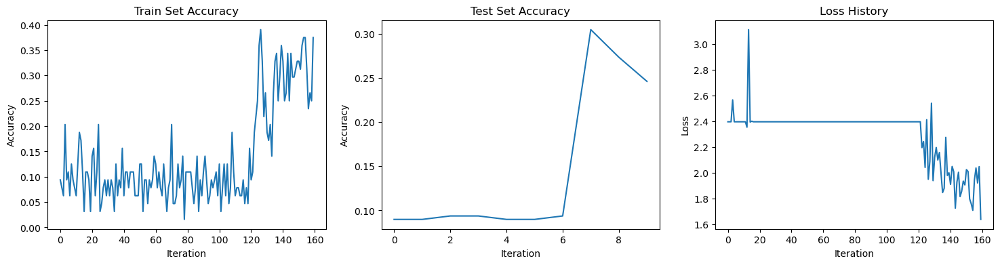

Training with Dropout: 0.2, Learning Rate: 0.001
9.38,2.40
7.81,2.40
10.94,2.40
4.69,2.40
10.94,2.40
10.94,2.40
7.81,2.40
9.38,2.40
14.06,2.40
7.81,2.40
10.94,2.43
14.06,2.32
15.62,2.39
15.62,2.42
25.00,2.37
17.19,2.27
Epoch 0 - Train Loss: 2.27 | Train Acc: 17.19% | Test Acc: 19.92%
Avg Train Loss: 2.39 | Avg Train Acc: 12.01%
17.19,2.20
26.56,2.04
26.56,2.09
39.06,2.08
37.50,1.81
35.94,2.24
28.12,2.50
20.31,2.66
26.56,2.27
26.56,2.20
25.00,2.24
29.69,2.34
23.44,2.14
25.00,2.18
32.81,2.25
31.25,2.16
Epoch 1 - Train Loss: 2.16 | Train Acc: 31.25% | Test Acc: 21.09%
Avg Train Loss: 2.21 | Avg Train Acc: 28.22%
29.69,2.17
23.44,2.14
32.81,1.98
31.25,2.13
40.62,2.05
35.94,2.10
46.88,1.70
43.75,1.68
42.19,1.69
35.94,2.09
37.50,1.85
42.19,1.80
40.62,1.75
48.44,1.56
62.50,1.25
56.25,1.61
Epoch 2 - Train Loss: 1.61 | Train Acc: 56.25% | Test Acc: 44.14%
Avg Train Loss: 1.85 | Avg Train Acc: 40.62%
48.44,1.78
50.00,1.53
53.12,1.44
51.56,1.62
40.62,1.85
45.31,1.95
48.44,1.55
60.94,1.22
39.06,1.

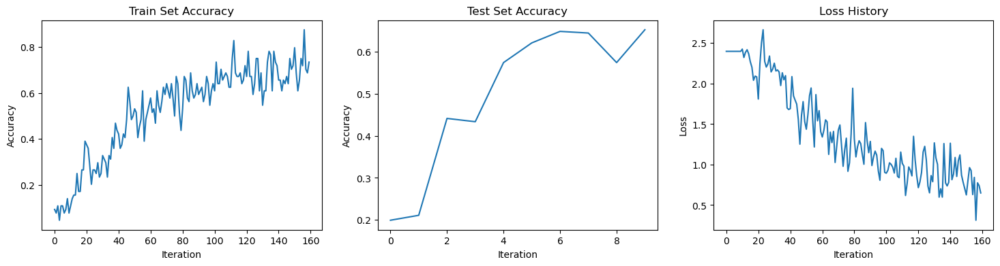

Training with Dropout: 0.25, Learning Rate: 0.003
9.38,2.40
4.69,2.40
7.81,2.40
6.25,2.40
7.81,2.40
14.06,2.81
17.19,2.39
7.81,2.40
9.38,2.40
9.38,2.40
20.31,2.42
29.69,2.21
18.75,2.29
10.94,2.43
20.31,2.31
12.50,2.36
Epoch 0 - Train Loss: 2.36 | Train Acc: 12.50% | Test Acc: 30.86%
Avg Train Loss: 2.40 | Avg Train Acc: 12.89%
35.94,2.28
26.56,2.16
9.38,2.41
9.38,2.40
1.56,2.40
10.94,2.40
4.69,2.40
6.25,2.40
3.12,2.40
6.25,2.41
6.25,2.36
35.94,2.06
15.62,2.59
18.75,2.16
17.19,2.31
18.75,2.27
Epoch 1 - Train Loss: 2.27 | Train Acc: 18.75% | Test Acc: 12.89%
Avg Train Loss: 2.34 | Avg Train Acc: 14.16%
14.06,2.32
18.75,2.30
17.19,2.22
35.94,2.03
25.00,2.15
29.69,2.04
32.81,1.94
37.50,2.04
45.31,1.81
34.38,1.86
35.94,1.85
40.62,2.14
37.50,1.67
40.62,2.29
40.62,1.73
48.44,1.73
Epoch 2 - Train Loss: 1.73 | Train Acc: 48.44% | Test Acc: 25.78%
Avg Train Loss: 2.01 | Avg Train Acc: 33.40%
37.50,1.82
42.19,1.73
39.06,1.76
39.06,2.10
31.25,2.05
34.38,1.86
40.62,1.72
43.75,1.54
37.50,1.82
48.44,

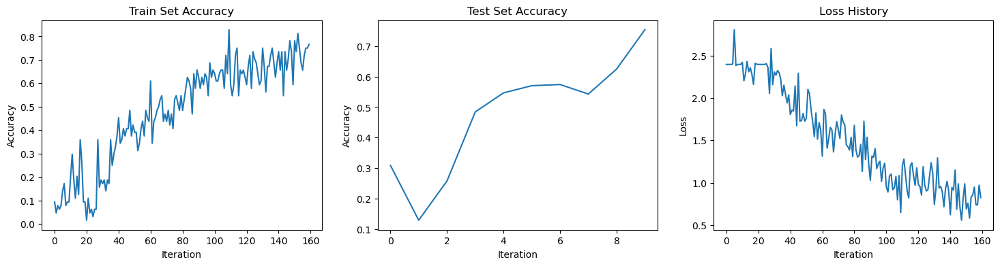

Training with Dropout: 0.25, Learning Rate: 0.002
14.06,2.40
6.25,2.40
12.50,2.40
10.94,2.40
12.50,2.40
9.38,2.40
6.25,2.38
14.06,2.63
17.19,2.40
14.06,2.37
17.19,2.27
20.31,2.63
21.88,2.29
6.25,2.57
12.50,2.25
17.19,2.30
Epoch 0 - Train Loss: 2.30 | Train Acc: 17.19% | Test Acc: 14.84%
Avg Train Loss: 2.41 | Avg Train Acc: 13.28%
18.75,2.33
17.19,2.38
23.44,2.22
20.31,2.28
21.88,2.37
31.25,2.42
37.50,2.13
37.50,2.08
39.06,2.15
39.06,1.92
26.56,2.16
40.62,1.89
39.06,1.96
28.12,1.90
46.88,1.55
39.06,1.89
Epoch 1 - Train Loss: 1.89 | Train Acc: 39.06% | Test Acc: 32.42%
Avg Train Loss: 2.10 | Avg Train Acc: 31.64%
51.56,1.52
45.31,1.89
40.62,1.83
37.50,1.74
31.25,2.11
35.94,1.96
51.56,1.79
56.25,1.71
40.62,2.21
51.56,1.72
37.50,1.90
53.12,1.61
50.00,1.57
43.75,1.71
40.62,1.88
57.81,1.48
Epoch 2 - Train Loss: 1.48 | Train Acc: 57.81% | Test Acc: 46.88%
Avg Train Loss: 1.79 | Avg Train Acc: 45.31%
46.88,1.65
35.94,1.85
53.12,1.59
64.06,1.62
53.12,1.33
46.88,1.74
42.19,1.79
56.25,1.97
67.19

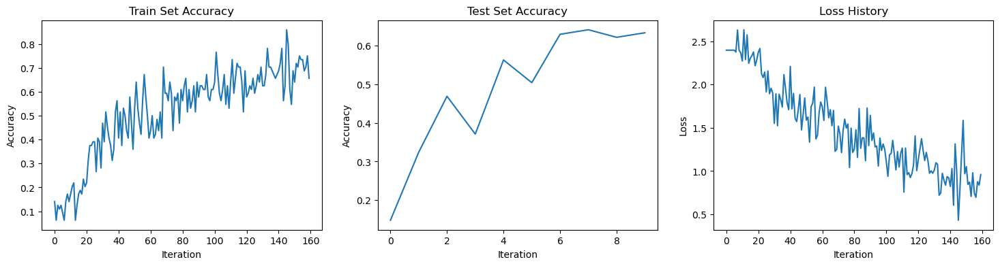

Training with Dropout: 0.25, Learning Rate: 0.001
4.69,2.40
6.25,2.40
7.81,2.40
3.12,2.40
9.38,2.40
14.06,2.46
12.50,2.38
9.38,2.40
7.81,2.40
17.19,2.40
7.81,2.39
23.44,2.29
20.31,2.34
17.19,2.44
23.44,2.14
12.50,2.35
Epoch 0 - Train Loss: 2.35 | Train Acc: 12.50% | Test Acc: 16.02%
Avg Train Loss: 2.37 | Avg Train Acc: 12.30%
23.44,2.29
21.88,2.21
31.25,2.13
29.69,2.30
40.62,1.81
26.56,2.01
42.19,1.84
32.81,1.94
29.69,1.91
32.81,1.91
43.75,1.57
39.06,1.74
35.94,1.78
40.62,1.78
42.19,1.55
51.56,1.44
Epoch 1 - Train Loss: 1.44 | Train Acc: 51.56% | Test Acc: 43.36%
Avg Train Loss: 1.89 | Avg Train Acc: 35.25%
43.75,1.45
46.88,1.60
32.81,1.83
48.44,1.50
48.44,1.69
40.62,1.61
40.62,1.71
43.75,1.69
32.81,2.05
45.31,1.54
53.12,1.46
48.44,1.35
54.69,1.31
39.06,1.87
50.00,1.67
42.19,1.78
Epoch 2 - Train Loss: 1.78 | Train Acc: 42.19% | Test Acc: 55.47%
Avg Train Loss: 1.63 | Avg Train Acc: 44.43%
54.69,1.55
54.69,1.55
56.25,1.61
43.75,1.61
48.44,1.46
32.81,1.87
46.88,1.43
60.94,1.23
46.88,1.7

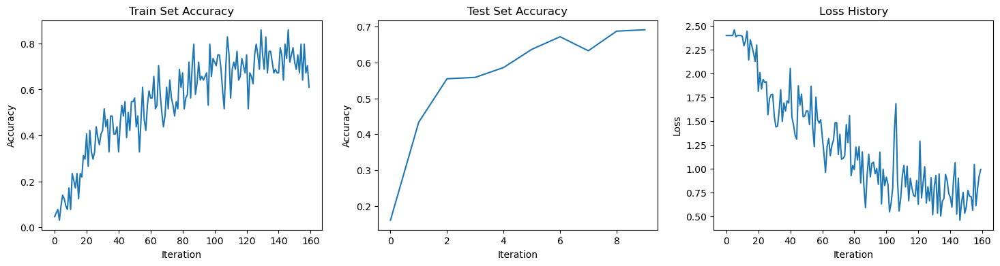

Training with Dropout: 0.3, Learning Rate: 0.003
7.81,2.40
6.25,2.40
10.94,2.40
14.06,2.40
15.62,2.40
20.31,3.65
6.25,2.40
17.19,2.38
7.81,2.40
7.81,2.40
12.50,2.40
9.38,2.39
18.75,2.57
6.25,2.40
3.12,2.40
7.81,2.40
Epoch 0 - Train Loss: 2.40 | Train Acc: 7.81% | Test Acc: 9.38%
Avg Train Loss: 2.49 | Avg Train Acc: 10.74%
9.38,2.40
9.38,2.38
12.50,2.38
21.88,2.33
15.62,2.45
34.38,2.07
25.00,2.28
28.12,2.25
17.19,2.21
29.69,2.09
42.19,2.13
31.25,2.15
21.88,2.17
26.56,2.18
23.44,2.22
31.25,1.98
Epoch 1 - Train Loss: 1.98 | Train Acc: 31.25% | Test Acc: 29.69%
Avg Train Loss: 2.23 | Avg Train Acc: 23.73%
43.75,2.11
37.50,1.97
28.12,2.25
35.94,2.01
32.81,2.00
35.94,2.02
32.81,1.84
40.62,1.79
39.06,1.60
29.69,1.99
40.62,1.77
34.38,1.87
39.06,1.94
32.81,1.95
46.88,1.78
56.25,1.71
Epoch 2 - Train Loss: 1.71 | Train Acc: 56.25% | Test Acc: 44.53%
Avg Train Loss: 1.91 | Avg Train Acc: 37.89%
53.12,1.84
60.94,1.38
45.31,1.90
48.44,1.91
54.69,2.03
57.81,1.73
45.31,1.53
45.31,1.72
28.12,2.10
32.8

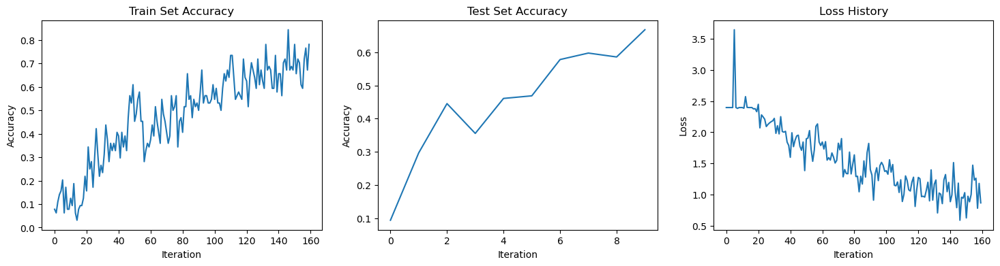

Training with Dropout: 0.3, Learning Rate: 0.002
10.94,2.40
3.12,2.40
10.94,2.40
6.25,2.40
15.62,2.35
20.31,2.50
25.00,2.20
34.38,2.47
15.62,2.32
15.62,2.33
9.38,2.54
7.81,2.38
17.19,2.38
9.38,2.51
9.38,2.40
10.94,2.40
Epoch 0 - Train Loss: 2.40 | Train Acc: 10.94% | Test Acc: 9.77%
Avg Train Loss: 2.40 | Avg Train Acc: 13.87%
10.94,2.40
12.50,2.40
3.12,2.40
4.69,2.39
14.06,2.36
18.75,2.29
20.31,2.58
20.31,2.23
25.00,2.37
23.44,2.23
29.69,2.07
37.50,1.90
35.94,1.99
39.06,2.00
37.50,1.99
34.38,1.96
Epoch 1 - Train Loss: 1.96 | Train Acc: 34.38% | Test Acc: 34.77%
Avg Train Loss: 2.22 | Avg Train Acc: 22.95%
31.25,2.05
34.38,1.68
37.50,1.84
42.19,1.76
45.31,1.82
43.75,1.68
50.00,1.70
45.31,1.83
43.75,2.10
29.69,2.15
26.56,2.22
48.44,1.67
40.62,1.82
48.44,1.73
43.75,1.63
45.31,1.97
Epoch 2 - Train Loss: 1.97 | Train Acc: 45.31% | Test Acc: 38.28%
Avg Train Loss: 1.85 | Avg Train Acc: 41.02%
35.94,2.29
51.56,1.57
40.62,1.45
48.44,1.59
37.50,2.01
53.12,1.56
39.06,1.74
54.69,1.53
46.88,1.53


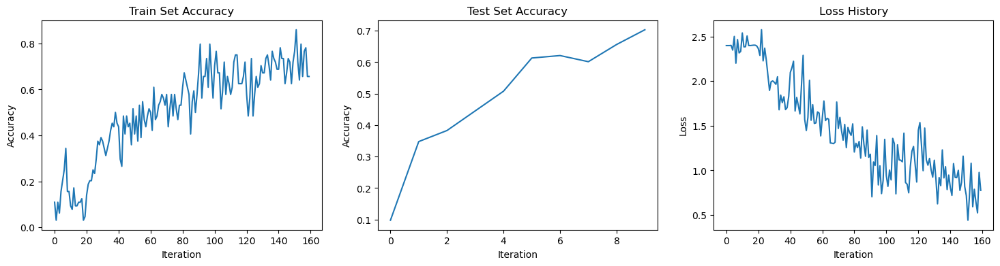

Training with Dropout: 0.3, Learning Rate: 0.001
4.69,2.40
7.81,2.40
7.81,2.40
10.94,2.40
7.81,2.40
14.06,2.40
6.25,2.40
7.81,2.40
10.94,2.37
20.31,2.43
17.19,2.25
23.44,2.34
14.06,2.34
20.31,2.34
14.06,2.34
20.31,2.33
Epoch 0 - Train Loss: 2.33 | Train Acc: 20.31% | Test Acc: 14.84%
Avg Train Loss: 2.37 | Avg Train Acc: 12.99%
18.75,2.38
23.44,2.32
21.88,2.35
29.69,2.26
26.56,2.22
37.50,2.11
40.62,2.00
42.19,1.85
43.75,1.68
37.50,2.00
31.25,2.13
35.94,1.82
37.50,1.92
39.06,1.89
32.81,2.16
40.62,1.73
Epoch 1 - Train Loss: 1.73 | Train Acc: 40.62% | Test Acc: 31.64%
Avg Train Loss: 2.05 | Avg Train Acc: 33.69%
48.44,1.71
39.06,1.82
37.50,1.91
35.94,1.74
45.31,1.66
46.88,1.56
34.38,1.90
37.50,1.69
35.94,1.68
37.50,1.67
54.69,1.39
50.00,1.55
57.81,1.31
34.38,2.05
45.31,1.43
46.88,1.35
Epoch 2 - Train Loss: 1.35 | Train Acc: 46.88% | Test Acc: 42.97%
Avg Train Loss: 1.65 | Avg Train Acc: 42.97%
43.75,1.50
40.62,1.64
48.44,1.50
45.31,1.64
48.44,1.39
60.94,1.05
53.12,1.49
56.25,1.19
60.94,1.

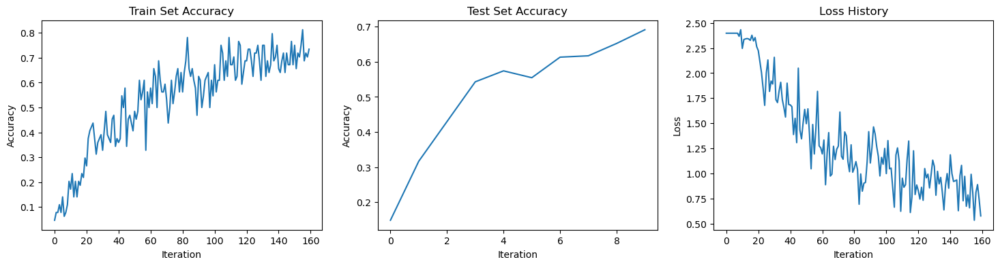

In [72]:
sweepTrain(10)

In [74]:
results

[{'dropout': 0.2,
  'lr': 0.003,
  'avg_train_acc': 0.7568359375,
  'avg_train_loss': 0.6914428677409887,
  'avg_test_acc': 0.75390625,
  'train_accs': [0.0625,
   0.078125,
   0.09375,
   0.109375,
   0.140625,
   0.140625,
   0.046875,
   0.125,
   0.09375,
   0.09375,
   0.125,
   0.109375,
   0.15625,
   0.046875,
   0.140625,
   0.265625,
   0.21875,
   0.078125,
   0.140625,
   0.03125,
   0.140625,
   0.203125,
   0.203125,
   0.375,
   0.21875,
   0.21875,
   0.34375,
   0.25,
   0.28125,
   0.296875,
   0.28125,
   0.25,
   0.28125,
   0.3125,
   0.21875,
   0.359375,
   0.3125,
   0.421875,
   0.3125,
   0.375,
   0.4375,
   0.328125,
   0.421875,
   0.359375,
   0.484375,
   0.375,
   0.3125,
   0.328125,
   0.46875,
   0.453125,
   0.5,
   0.484375,
   0.484375,
   0.375,
   0.484375,
   0.4375,
   0.421875,
   0.390625,
   0.484375,
   0.484375,
   0.515625,
   0.609375,
   0.578125,
   0.515625,
   0.578125,
   0.46875,
   0.546875,
   0.546875,
   0.5625,
   0.59375,
   

In [80]:
best3 = sorted(results, key=lambda x: x['avg_test_acc'], reverse=True)[:3]
tsts = [d.get('avg_test_acc') for d in best3]
tsts
best3

[{'dropout': 0.2,
  'lr': 0.003,
  'avg_train_acc': 0.7568359375,
  'avg_train_loss': 0.6914428677409887,
  'avg_test_acc': 0.75390625,
  'train_accs': [0.0625,
   0.078125,
   0.09375,
   0.109375,
   0.140625,
   0.140625,
   0.046875,
   0.125,
   0.09375,
   0.09375,
   0.125,
   0.109375,
   0.15625,
   0.046875,
   0.140625,
   0.265625,
   0.21875,
   0.078125,
   0.140625,
   0.03125,
   0.140625,
   0.203125,
   0.203125,
   0.375,
   0.21875,
   0.21875,
   0.34375,
   0.25,
   0.28125,
   0.296875,
   0.28125,
   0.25,
   0.28125,
   0.3125,
   0.21875,
   0.359375,
   0.3125,
   0.421875,
   0.3125,
   0.375,
   0.4375,
   0.328125,
   0.421875,
   0.359375,
   0.484375,
   0.375,
   0.3125,
   0.328125,
   0.46875,
   0.453125,
   0.5,
   0.484375,
   0.484375,
   0.375,
   0.484375,
   0.4375,
   0.421875,
   0.390625,
   0.484375,
   0.484375,
   0.515625,
   0.609375,
   0.578125,
   0.515625,
   0.578125,
   0.46875,
   0.546875,
   0.546875,
   0.5625,
   0.59375,
   

In [33]:
best = sorted(results, key=lambda x: x['avg_test_acc'], reverse=True)[0]
best

NameError: name 'results' is not defined

7.81,2.40
12.50,2.40
6.25,2.40
7.81,2.40
1.56,2.40
17.19,2.29
14.06,4.86
31.25,2.39
23.44,2.43
10.94,2.40
6.25,2.40
9.38,2.40
7.81,2.40
7.81,2.40
6.25,2.40
10.94,2.40
Epoch 0 - Train Loss: 2.40 | Train Acc: 10.94% | Test Acc: 9.38%
Avg Train Loss: 2.55 | Avg Train Acc: 11.33%
9.38,2.40
3.12,2.40
9.38,2.40
3.12,2.40
10.94,2.40
3.12,2.40
15.62,2.40
10.94,2.40
7.81,2.39
20.31,2.30
39.06,2.66
23.44,2.33
4.69,2.40
10.94,2.40
10.94,2.40
12.50,2.40
Epoch 1 - Train Loss: 2.40 | Train Acc: 12.50% | Test Acc: 9.38%
Avg Train Loss: 2.40 | Avg Train Acc: 12.21%
10.94,2.40
4.69,2.40
10.94,2.40
4.69,2.40
9.38,2.40
9.38,2.40
12.50,2.40
12.50,2.34
10.94,2.47
17.19,2.46
17.19,2.37
20.31,2.29
25.00,2.35
23.44,2.18
17.19,2.41
18.75,2.27
Epoch 2 - Train Loss: 2.27 | Train Acc: 18.75% | Test Acc: 20.70%
Avg Train Loss: 2.37 | Avg Train Acc: 14.06%
20.31,2.32
23.44,2.21
23.44,2.26
23.44,2.15
23.44,2.01
29.69,2.05
28.12,2.19
31.25,1.98
37.50,1.99
40.62,1.74
40.62,1.54
53.12,1.44
46.88,1.59
45.31,1.56
37.50,1

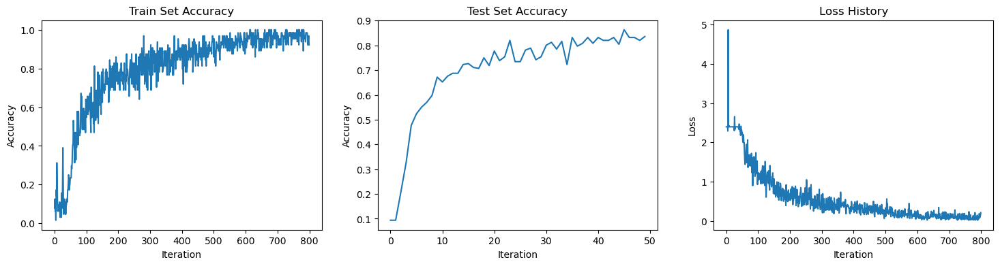

NameError: name 'model' is not defined

In [84]:
# training best model
net = build_model(best['dropout'])
optimizer = torch.optim.Adam(net.parameters(), lr=best['lr'], betas=(0.9, 0.999))
loss_fn = SF.ce_count_loss()
tr, ts, ls, avtr, avts, avls = train_model(50)
print(f"Plots")
plot_acc(tr, ts, ls)

In [90]:
#torch.save(net, 'nmc_model_full.pth')
torch.save(net.state_dict(), 'nmc_model_state_dict.pth')

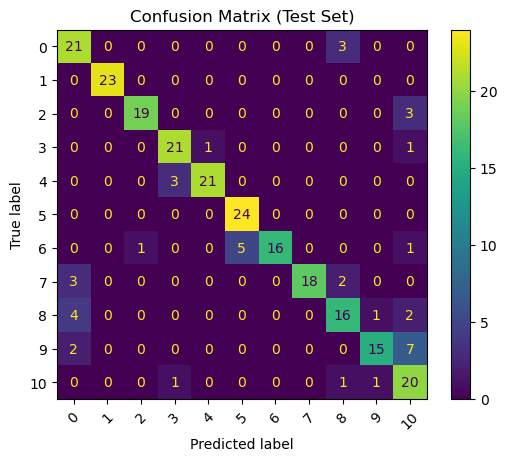

In [92]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

all_preds, all_targets = [], []
net.eval()
with torch.no_grad():
    for data, targets in test_loader:
        data, targets = data.to(device), targets.to(device)
        spk_rec = forward_pass(net, data)
        pred = spk_rec.sum(dim=0).argmax(dim=1)
        all_preds.extend(pred.cpu().numpy())
        all_targets.extend(targets.cpu().numpy())

cm = confusion_matrix(all_targets, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(xticks_rotation=45)
plt.title("Confusion Matrix (Test Set)")
plt.show()

In [100]:
for i, layer in enumerate(net):
    if isinstance(layer, nn.Conv2d):
        weight = layer.weight.detach().cpu().numpy()
        weight_flat = weight.reshape(weight.shape[0], -1)
        np.savetxt(f"layer{i}_weights_float.csv", weight_flat, fmt="%.6f", delimiter=",")
    
    elif isinstance(layer, nn.Linear):
        weight = layer.weight.detach().cpu().numpy()
        np.savetxt(f"layer{i}_weights_float.csv", weight, fmt="%.6f", delimiter=",")

In [31]:
net = build_model(0.2).to(device)
float_state_dict = torch.load('nmc_model_state_dict.pth')
net.load_state_dict(float_state_dict, strict=False)

<All keys matched successfully>

In [33]:
def predict_from_cached_test(index):
    frames, true_label = cached_test[index]  
    frames = torch.from_numpy(frames).float()  
    frames = frames.unsqueeze(1)              
    frames = frames.to(device)
    # Model inference
    net.eval()
    with torch.no_grad():
        spk_rec = forward_pass(net, frames)            
        spike_sum = spk_rec.sum(dim=0)                 
        predicted_class = spike_sum.argmax(dim=1).item()

    predicted_gesture = DVS_GESTURE_CLASSES[predicted_class]
    true_gesture = DVS_GESTURE_CLASSES[true_label]

    # Print results
    print(f"\nIndex: {index}")
    print(f"Predicted Gesture: {predicted_gesture} (Class {predicted_class})")
    print(f"True Gesture: {true_gesture} (Class {true_label})")
    print(f"Prediction Correct? {'Yes' if predicted_class == true_label else 'No'}")

    return predicted_class == true_label
cnter=0
for i in range(20):
    cnter += 1 if predict_from_cached_test(i) else 0
cnter


Index: 0
Predicted Gesture: Left arm cw (Class 5)
True Gesture: Left arm cw (Class 5)
Prediction Correct? Yes

Index: 1
Predicted Gesture: Right arm cw (Class 3)
True Gesture: Right arm ccw (Class 4)
Prediction Correct? No

Index: 2
Predicted Gesture: Left arm cw (Class 5)
True Gesture: Left arm ccw (Class 6)
Prediction Correct? No

Index: 3
Predicted Gesture: Arm roll (Class 7)
True Gesture: Arm roll (Class 7)
Prediction Correct? Yes

Index: 4
Predicted Gesture: Right arm cw (Class 3)
True Gesture: Right arm cw (Class 3)
Prediction Correct? Yes

Index: 5
Predicted Gesture: Left hand wave (Class 2)
True Gesture: Left hand wave (Class 2)
Prediction Correct? Yes

Index: 6
Predicted Gesture: Air drums (Class 8)
True Gesture: Hand clapping (Class 0)
Prediction Correct? No

Index: 7
Predicted Gesture: Right hand wave (Class 1)
True Gesture: Right hand wave (Class 1)
Prediction Correct? Yes

Index: 8
Predicted Gesture: Air guitar (Class 9)
True Gesture: Air guitar (Class 9)
Prediction Corre

14

In [157]:
import cv2
import os
import scipy.ndimage
def predict_from_webcam(output_folder="frames", every_n_frames=32, threshold=20):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    cap = cv2.VideoCapture(0)
    
    previous_gray = None
    event_memory = np.full((128, 128), -np.inf)
    batch = []
    frame_index = 0

    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    dt_per_frame = 1000 / fps  # in ms
    min_time_between_events = 100  # ms
    predicted_gesture = DVS_GESTURE_CLASSES[10]
    while cap.isOpened():
        ret, frame = cap.read()
        frame = cv2.flip(frame, 1)
        if not ret:
            break

        frame_resized = cv2.resize(frame, (128, 128))
        gray = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2GRAY)
        
        if previous_gray is not None:
            delta = gray.astype(np.int16) - previous_gray.astype(np.int16)
            raw_on = (delta > threshold).astype(np.float32)
            raw_off = (delta < -threshold).astype(np.float32)
            
            now = frame_index * dt_per_frame
            on_events = np.where((raw_on == 1) & ((now - event_memory) > min_time_between_events), 1.0, 0.0)
            off_events = np.where((raw_off == 1) & ((now - event_memory) > min_time_between_events), 1.0, 0.0)
            
            # not using
            
            # Optional: Spatial denoising
            on_events = scipy.ndimage.binary_opening(on_events, structure=np.ones((2, 2))).astype(np.float32)
            off_events = scipy.ndimage.binary_opening(off_events, structure=np.ones((2, 2))).astype(np.float32)

            # Update event memory
            event_memory = np.where((on_events + off_events) > 0, now, event_memory)
            
            combined_frame = np.stack([raw_off, raw_on], axis=-1)*255  # (H, W, 2)
            #print("Combined frame shape:", combined_frame.shape)
            display_scale = 4  # or 6, 8 — increase as needed
            on_display = cv2.resize(raw_on * 255, (128 * display_scale, 128 * display_scale), interpolation=cv2.INTER_NEAREST)
            off_display = cv2.resize(raw_off * 255, (128 * display_scale, 128 * display_scale), interpolation=cv2.INTER_NEAREST)
            
            cv2.imshow("ON Events", on_display)
            cv2.imshow("OFF Events", off_display)
                

            batch.append(combined_frame)

            if len(batch) == every_n_frames:
                #print("Batch collected, processing...")
                batch_np = np.array(batch)  # Shape (32, 128, 128, 2)
                print(batch_np.shape)
                resized_batch = []
                for frame_pair in batch_np:
                    resized_frame = cv2.resize(frame_pair, (32, 32))  # Resize each combined frame
                    resized_batch.append(resized_frame)

                resized_batch_np = np.array(resized_batch)  # (32, 32, 32, 2)
                resized_batch_np = np.moveaxis(resized_batch_np, -1, 1)  # (32, 2, 32, 32)
                #print("Final batch shape ready for model:", resized_batch_np.shape)

                frames = torch.from_numpy(resized_batch_np).float()
                frames = frames.unsqueeze(1).to(device)  # [T, B=1, C, H, W]
                #print("Batch stats:", frames.max(), frames.min(), frames.mean())
                # Predict
                net.eval()
                with torch.no_grad():
                    spk_rec = forward_pass(net, frames)
                    spike_sum = spk_rec.sum(dim=0)
                    print("Spike Sum per Class:", spike_sum)
                    predicted_class = spike_sum.argmax(dim=1).item()

                predicted_gesture = DVS_GESTURE_CLASSES[predicted_class]
                print(f"Predicted Gesture: {predicted_gesture}")

                batch = []  # Reset batch for next set


        previous_gray = gray

        label_text = f"Predicted Label: {predicted_gesture}"
        cv2.putText(frame, label_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2.imshow('Webcam Feed', frame)
        
        save_path = os.path.join(save_folder, f"frame_{frame_index:05d}_label_{predicted_gesture}.png")
        cv2.imwrite(save_path, thresh_frame)
        frame_index+=1
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()
    print("Webcam processing complete.")


In [158]:
predict_from_webcam(output_folder="frames", every_n_frames=32, threshold=5)

(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 4.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0., 10.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 0.,  0.,  0.,  1., 10.,  0.,  0.,  0.,  0.,  0., 11.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 0.,  0.,  0.,  0.,  4.,  2.,  3.,  0.,  0.,  1., 12.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 2.,  0.,  0.,  0.,  7.,  2.,  0.,  0.,  0.,  0., 18.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 2.,  0.,  0.,  0.,  3.,  0.,  0.,  0.,  0.,  1., 13.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum per Class: tensor([[ 3.,  1.,  0.,  1.,  2.,  3.,  2.,  0.,  0.,  1., 13.]],
       device='mps:0')
Predicted Gesture: Other gestures
(32, 128, 128, 2)
Spike Sum 

In [169]:
results=[{'dropout': 0.2,
  'lr': 0.003,
  'avg_train_acc': 0.7568359375,
  'avg_train_loss': 0.6914428677409887,
  'avg_test_acc': 0.75390625,
  'train_accs': [0.0625,
   0.078125,
   0.09375,
   0.109375,
   0.140625,
   0.140625,
   0.046875,
   0.125,
   0.09375,
   0.09375,
   0.125,
   0.109375,
   0.15625,
   0.046875,
   0.140625,
   0.265625,
   0.21875,
   0.078125,
   0.140625,
   0.03125,
   0.140625,
   0.203125,
   0.203125,
   0.375,
   0.21875,
   0.21875,
   0.34375,
   0.25,
   0.28125,
   0.296875,
   0.28125,
   0.25,
   0.28125,
   0.3125,
   0.21875,
   0.359375,
   0.3125,
   0.421875,
   0.3125,
   0.375,
   0.4375,
   0.328125,
   0.421875,
   0.359375,
   0.484375,
   0.375,
   0.3125,
   0.328125,
   0.46875,
   0.453125,
   0.5,
   0.484375,
   0.484375,
   0.375,
   0.484375,
   0.4375,
   0.421875,
   0.390625,
   0.484375,
   0.484375,
   0.515625,
   0.609375,
   0.578125,
   0.515625,
   0.578125,
   0.46875,
   0.546875,
   0.546875,
   0.5625,
   0.59375,
   0.6875,
   0.625,
   0.59375,
   0.59375,
   0.625,
   0.578125,
   0.703125,
   0.53125,
   0.671875,
   0.5625,
   0.515625,
   0.5625,
   0.640625,
   0.578125,
   0.671875,
   0.578125,
   0.6875,
   0.671875,
   0.640625,
   0.609375,
   0.59375,
   0.578125,
   0.703125,
   0.6875,
   0.59375,
   0.546875,
   0.59375,
   0.59375,
   0.671875,
   0.625,
   0.65625,
   0.640625,
   0.578125,
   0.65625,
   0.640625,
   0.671875,
   0.640625,
   0.71875,
   0.6875,
   0.609375,
   0.640625,
   0.59375,
   0.75,
   0.765625,
   0.75,
   0.75,
   0.703125,
   0.75,
   0.71875,
   0.703125,
   0.6875,
   0.734375,
   0.71875,
   0.6875,
   0.71875,
   0.734375,
   0.625,
   0.78125,
   0.75,
   0.671875,
   0.796875,
   0.703125,
   0.765625,
   0.78125,
   0.6875,
   0.703125,
   0.703125,
   0.75,
   0.78125,
   0.765625,
   0.734375,
   0.75,
   0.734375,
   0.671875,
   0.703125,
   0.8125,
   0.796875,
   0.796875,
   0.8125,
   0.78125,
   0.796875,
   0.71875,
   0.84375,
   0.671875,
   0.734375,
   0.75,
   0.71875,
   0.796875,
   0.78125,
   0.59375],
  'test_accs': [0.17578125,
   0.203125,
   0.2890625,
   0.5,
   0.46875,
   0.54296875,
   0.6484375,
   0.66796875,
   0.703125,
   0.75390625],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.3734488487243652,
   3.273346424102783,
   2.384538173675537,
   2.412205696105957,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.4118542671203613,
   2.5055882930755615,
   2.400163173675537,
   2.397895097732544,
   2.3214216232299805,
   2.712247610092163,
   2.1593611240386963,
   2.386806011199951,
   2.324498176574707,
   2.3824622631073,
   2.3579535484313965,
   2.285468339920044,
   2.2283272743225098,
   1.9826886653900146,
   2.3539204597473145,
   2.4039392471313477,
   1.995046615600586,
   2.3756589889526367,
   2.10860013961792,
   1.9242897033691406,
   1.95645010471344,
   2.0343480110168457,
   1.989065170288086,
   1.8453950881958008,
   2.129479169845581,
   1.8299803733825684,
   1.990605115890503,
   1.75892174243927,
   2.369232177734375,
   1.7098395824432373,
   1.7017403841018677,
   1.9075391292572021,
   1.7654609680175781,
   1.714552402496338,
   1.506478190422058,
   1.9415305852890015,
   1.7814812660217285,
   1.762540578842163,
   1.5499173402786255,
   1.7226353883743286,
   1.6700791120529175,
   1.7256689071655273,
   1.4459937810897827,
   1.61627197265625,
   1.5441120862960815,
   1.5758311748504639,
   1.6284868717193604,
   1.4904404878616333,
   1.4813319444656372,
   1.7523458003997803,
   1.5129361152648926,
   1.1715965270996094,
   1.1581846475601196,
   1.450638771057129,
   1.291517734527588,
   1.46506929397583,
   1.3058898448944092,
   1.5347378253936768,
   1.4155575037002563,
   0.9947674870491028,
   1.0396958589553833,
   1.3916943073272705,
   1.5580697059631348,
   1.1869672536849976,
   1.2468054294586182,
   1.208082914352417,
   1.163165807723999,
   1.5409190654754639,
   1.0957865715026855,
   1.404042363166809,
   1.4410003423690796,
   1.1483111381530762,
   1.0862715244293213,
   1.052621841430664,
   1.1570465564727783,
   1.2428185939788818,
   1.130387783050537,
   1.155832052230835,
   1.2315716743469238,
   1.3235348463058472,
   1.0219277143478394,
   1.1417866945266724,
   1.026166558265686,
   1.1563743352890015,
   1.0202767848968506,
   1.221520185470581,
   1.098026156425476,
   0.9946714639663696,
   0.9938880205154419,
   1.0959398746490479,
   1.000824213027954,
   1.035536527633667,
   1.2141984701156616,
   0.9973827600479126,
   1.2600148916244507,
   1.2109872102737427,
   1.284588098526001,
   0.9307968020439148,
   0.8787107467651367,
   1.1283180713653564,
   1.0119667053222656,
   1.2049603462219238,
   0.9326920509338379,
   0.8575263023376465,
   0.6884486675262451,
   0.9419475793838501,
   1.0710200071334839,
   0.8043285012245178,
   0.9194007515907288,
   0.8549871444702148,
   0.8970054984092712,
   0.7682540416717529,
   1.036866545677185,
   0.7225061655044556,
   0.7465100288391113,
   0.8811588883399963,
   1.0199713706970215,
   0.5819011926651001,
   0.7160695195198059,
   1.0852845907211304,
   0.6146715879440308,
   0.6541555523872375,
   0.7911278009414673,
   0.7364116907119751,
   0.6501702070236206,
   0.8462435007095337,
   0.7430101633071899,
   0.7179492712020874,
   0.6483107805252075,
   0.7202922105789185,
   0.8526036739349365,
   0.7493886351585388,
   0.5298786163330078,
   0.9005997180938721,
   0.85999596118927,
   0.5861741304397583,
   0.4541034698486328,
   0.8235793709754944,
   0.5211422443389893,
   0.6573749780654907,
   0.5429986715316772,
   0.9305458068847656,
   0.4549753963947296,
   0.6871254444122314,
   0.8317513465881348,
   0.7140891551971436,
   0.7193728685379028,
   0.5450116395950317,
   0.6106480360031128,
   1.1241973638534546]},
 {'dropout': 0.2,
  'lr': 0.002,
  'avg_train_acc': 0.3134765625,
  'avg_train_loss': 1.8973573073744774,
  'avg_test_acc': 0.24609375,
  'train_accs': [0.09375,
   0.078125,
   0.0625,
   0.203125,
   0.09375,
   0.109375,
   0.0625,
   0.125,
   0.09375,
   0.078125,
   0.0625,
   0.125,
   0.1875,
   0.171875,
   0.109375,
   0.03125,
   0.109375,
   0.109375,
   0.09375,
   0.03125,
   0.140625,
   0.15625,
   0.0625,
   0.109375,
   0.203125,
   0.03125,
   0.046875,
   0.078125,
   0.09375,
   0.0625,
   0.09375,
   0.0625,
   0.09375,
   0.078125,
   0.03125,
   0.125,
   0.0625,
   0.09375,
   0.078125,
   0.15625,
   0.0625,
   0.109375,
   0.109375,
   0.078125,
   0.109375,
   0.109375,
   0.109375,
   0.0625,
   0.0625,
   0.0625,
   0.125,
   0.125,
   0.03125,
   0.09375,
   0.09375,
   0.046875,
   0.09375,
   0.078125,
   0.09375,
   0.140625,
   0.125,
   0.078125,
   0.109375,
   0.078125,
   0.0625,
   0.125,
   0.078125,
   0.03125,
   0.078125,
   0.09375,
   0.203125,
   0.046875,
   0.046875,
   0.0625,
   0.125,
   0.078125,
   0.09375,
   0.140625,
   0.015625,
   0.109375,
   0.109375,
   0.109375,
   0.109375,
   0.078125,
   0.046875,
   0.078125,
   0.140625,
   0.03125,
   0.09375,
   0.0625,
   0.109375,
   0.140625,
   0.09375,
   0.046875,
   0.0625,
   0.09375,
   0.078125,
   0.09375,
   0.109375,
   0.0625,
   0.125,
   0.03125,
   0.078125,
   0.125,
   0.0625,
   0.125,
   0.046875,
   0.078125,
   0.1875,
   0.109375,
   0.0625,
   0.078125,
   0.078125,
   0.0625,
   0.0625,
   0.09375,
   0.046875,
   0.078125,
   0.046875,
   0.15625,
   0.09375,
   0.109375,
   0.1875,
   0.21875,
   0.25,
   0.359375,
   0.390625,
   0.328125,
   0.21875,
   0.265625,
   0.1875,
   0.171875,
   0.203125,
   0.140625,
   0.265625,
   0.328125,
   0.34375,
   0.25,
   0.296875,
   0.359375,
   0.328125,
   0.25,
   0.265625,
   0.34375,
   0.25,
   0.34375,
   0.296875,
   0.296875,
   0.3125,
   0.328125,
   0.328125,
   0.3125,
   0.359375,
   0.375,
   0.375,
   0.3125,
   0.234375,
   0.265625,
   0.25,
   0.375],
  'test_accs': [0.08984375,
   0.08984375,
   0.09375,
   0.09375,
   0.08984375,
   0.08984375,
   0.09375,
   0.3046875,
   0.2734375,
   0.24609375],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.567999839782715,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.355870008468628,
   3.113751173019409,
   2.3958559036254883,
   2.402431011199951,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.197303295135498,
   2.2443342208862305,
   2.0432276725769043,
   2.4140625,
   1.9512858390808105,
   2.0914268493652344,
   2.5420379638671875,
   1.940732717514038,
   2.120854377746582,
   2.198198080062866,
   2.1009771823883057,
   2.1593594551086426,
   1.9995484352111816,
   1.8478939533233643,
   1.8812447786331177,
   2.2770426273345947,
   1.9804511070251465,
   2.0016820430755615,
   1.9115376472473145,
   2.0508899688720703,
   2.0094051361083984,
   1.726854920387268,
   1.9287112951278687,
   2.0054526329040527,
   1.8165409564971924,
   1.858772873878479,
   1.9370746612548828,
   1.907249927520752,
   2.0263171195983887,
   2.0118675231933594,
   1.7989163398742676,
   1.7610201835632324,
   1.7100515365600586,
   1.9452205896377563,
   2.0388264656066895,
   1.922615885734558,
   2.0495667457580566,
   1.6395121812820435]},
 {'dropout': 0.2,
  'lr': 0.001,
  'avg_train_acc': 0.708984375,
  'avg_train_loss': 0.7903076838701963,
  'avg_test_acc': 0.65234375,
  'train_accs': [0.09375,
   0.078125,
   0.109375,
   0.046875,
   0.109375,
   0.109375,
   0.078125,
   0.09375,
   0.140625,
   0.078125,
   0.109375,
   0.140625,
   0.15625,
   0.15625,
   0.25,
   0.171875,
   0.171875,
   0.265625,
   0.265625,
   0.390625,
   0.375,
   0.359375,
   0.28125,
   0.203125,
   0.265625,
   0.265625,
   0.25,
   0.296875,
   0.234375,
   0.25,
   0.328125,
   0.3125,
   0.296875,
   0.234375,
   0.328125,
   0.3125,
   0.40625,
   0.359375,
   0.46875,
   0.4375,
   0.421875,
   0.359375,
   0.375,
   0.421875,
   0.40625,
   0.484375,
   0.625,
   0.5625,
   0.484375,
   0.5,
   0.53125,
   0.515625,
   0.40625,
   0.453125,
   0.484375,
   0.609375,
   0.390625,
   0.484375,
   0.515625,
   0.546875,
   0.578125,
   0.515625,
   0.53125,
   0.46875,
   0.609375,
   0.546875,
   0.515625,
   0.5625,
   0.625,
   0.59375,
   0.640625,
   0.609375,
   0.578125,
   0.640625,
   0.578125,
   0.5,
   0.671875,
   0.640625,
   0.515625,
   0.4375,
   0.53125,
   0.671875,
   0.65625,
   0.578125,
   0.5625,
   0.6875,
   0.609375,
   0.578125,
   0.59375,
   0.640625,
   0.59375,
   0.609375,
   0.625,
   0.5625,
   0.59375,
   0.671875,
   0.640625,
   0.546875,
   0.609375,
   0.640625,
   0.609375,
   0.734375,
   0.640625,
   0.640625,
   0.703125,
   0.65625,
   0.671875,
   0.6875,
   0.671875,
   0.625,
   0.625,
   0.75,
   0.828125,
   0.6875,
   0.671875,
   0.671875,
   0.6875,
   0.640625,
   0.65625,
   0.71875,
   0.671875,
   0.78125,
   0.671875,
   0.671875,
   0.59375,
   0.640625,
   0.75,
   0.75,
   0.609375,
   0.6875,
   0.546875,
   0.609375,
   0.609375,
   0.734375,
   0.78125,
   0.765625,
   0.609375,
   0.78125,
   0.734375,
   0.71875,
   0.65625,
   0.65625,
   0.609375,
   0.65625,
   0.640625,
   0.671875,
   0.640625,
   0.75,
   0.703125,
   0.71875,
   0.796875,
   0.6875,
   0.609375,
   0.65625,
   0.75,
   0.71875,
   0.875,
   0.703125,
   0.6875,
   0.734375],
  'test_accs': [0.19921875,
   0.2109375,
   0.44140625,
   0.43359375,
   0.57421875,
   0.62109375,
   0.6484375,
   0.64453125,
   0.57421875,
   0.65234375],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.4255940914154053,
   2.3222882747650146,
   2.3865466117858887,
   2.417886257171631,
   2.366494655609131,
   2.269171714782715,
   2.203019618988037,
   2.040487766265869,
   2.0922977924346924,
   2.083010673522949,
   1.8093698024749756,
   2.2444567680358887,
   2.503744602203369,
   2.664607048034668,
   2.273685932159424,
   2.2038023471832275,
   2.24299955368042,
   2.339918613433838,
   2.144402503967285,
   2.179424285888672,
   2.2519755363464355,
   2.155852794647217,
   2.168642520904541,
   2.1436767578125,
   1.9763003587722778,
   2.133561611175537,
   2.0468649864196777,
   2.098134756088257,
   1.6989917755126953,
   1.6799752712249756,
   1.6910070180892944,
   2.0862772464752197,
   1.8488723039627075,
   1.7956489324569702,
   1.7464081048965454,
   1.5582168102264404,
   1.2520427703857422,
   1.6082546710968018,
   1.7771718502044678,
   1.5313117504119873,
   1.4368610382080078,
   1.6165845394134521,
   1.849722146987915,
   1.9456746578216553,
   1.5517109632492065,
   1.2177505493164062,
   1.8637521266937256,
   1.5407534837722778,
   1.6653685569763184,
   1.4058818817138672,
   1.3406453132629395,
   1.4263966083526611,
   1.5519533157348633,
   1.5278440713882446,
   1.1260392665863037,
   1.3999650478363037,
   1.2720990180969238,
   1.4093220233917236,
   1.02646005153656,
   1.2266132831573486,
   1.426112174987793,
   1.4894227981567383,
   1.240667700767517,
   0.9789801836013794,
   1.1815152168273926,
   1.3259806632995605,
   0.9173165559768677,
   1.0225508213043213,
   1.3781417608261108,
   1.9424318075180054,
   1.318716287612915,
   1.0951589345932007,
   1.219113826751709,
   1.2945911884307861,
   1.2593684196472168,
   1.1234691143035889,
   1.0044653415679932,
   1.5184096097946167,
   1.2927236557006836,
   1.1473686695098877,
   1.2860252857208252,
   0.9884752035140991,
   1.0936030149459839,
   1.1660213470458984,
   1.1174521446228027,
   0.9217739105224609,
   0.8069270253181458,
   1.200016975402832,
   1.1722314357757568,
   0.9034938216209412,
   0.8940760493278503,
   0.930743932723999,
   1.0217089653015137,
   1.0028550624847412,
   0.9682912826538086,
   0.8958895802497864,
   1.0779410600662231,
   0.8548964262008667,
   0.8388122320175171,
   1.1547034978866577,
   1.0145195722579956,
   0.9808164834976196,
   0.6187781095504761,
   0.7661121487617493,
   0.9712268710136414,
   0.930263876914978,
   0.8607746362686157,
   1.349012017250061,
   1.0602025985717773,
   0.8630231618881226,
   0.7154505252838135,
   0.7867091298103333,
   0.9020799398422241,
   1.1552098989486694,
   1.2254831790924072,
   1.0545096397399902,
   0.7358601093292236,
   0.6512423753738403,
   0.8640508055686951,
   0.7892061471939087,
   1.268298625946045,
   1.0821820497512817,
   1.0020174980163574,
   0.597994327545166,
   0.7020304203033447,
   0.5984026193618774,
   1.2594478130340576,
   0.7748008966445923,
   0.7369199991226196,
   0.7808875441551208,
   1.2640645503997803,
   0.8139554262161255,
   0.8836779594421387,
   1.0882296562194824,
   0.8535107374191284,
   1.0489273071289062,
   1.1194418668746948,
   0.8696550726890564,
   0.7819822430610657,
   0.7046037912368774,
   0.6259592771530151,
   0.8020178079605103,
   0.962729811668396,
   0.9257208108901978,
   0.6301189661026001,
   0.8419961929321289,
   0.3132873475551605,
   0.7749606370925903,
   0.740394115447998,
   0.6496169567108154]},
 {'dropout': 0.25,
  'lr': 0.003,
  'avg_train_acc': 0.7255859375,
  'avg_train_loss': 0.791816808283329,
  'avg_test_acc': 0.75390625,
  'train_accs': [0.09375,
   0.046875,
   0.078125,
   0.0625,
   0.078125,
   0.140625,
   0.171875,
   0.078125,
   0.09375,
   0.09375,
   0.203125,
   0.296875,
   0.1875,
   0.109375,
   0.203125,
   0.125,
   0.359375,
   0.265625,
   0.09375,
   0.09375,
   0.015625,
   0.109375,
   0.046875,
   0.0625,
   0.03125,
   0.0625,
   0.0625,
   0.359375,
   0.15625,
   0.1875,
   0.171875,
   0.1875,
   0.140625,
   0.1875,
   0.171875,
   0.359375,
   0.25,
   0.296875,
   0.328125,
   0.375,
   0.453125,
   0.34375,
   0.359375,
   0.40625,
   0.375,
   0.40625,
   0.40625,
   0.484375,
   0.375,
   0.421875,
   0.390625,
   0.390625,
   0.3125,
   0.34375,
   0.40625,
   0.4375,
   0.375,
   0.484375,
   0.453125,
   0.4375,
   0.609375,
   0.34375,
   0.4375,
   0.453125,
   0.484375,
   0.5,
   0.53125,
   0.546875,
   0.4375,
   0.46875,
   0.4375,
   0.484375,
   0.421875,
   0.46875,
   0.40625,
   0.53125,
   0.546875,
   0.515625,
   0.484375,
   0.546875,
   0.484375,
   0.53125,
   0.578125,
   0.625,
   0.609375,
   0.578125,
   0.46875,
   0.640625,
   0.578125,
   0.65625,
   0.625,
   0.578125,
   0.625,
   0.59375,
   0.640625,
   0.625,
   0.546875,
   0.6875,
   0.625,
   0.65625,
   0.640625,
   0.609375,
   0.609375,
   0.640625,
   0.65625,
   0.65625,
   0.578125,
   0.71875,
   0.640625,
   0.828125,
   0.59375,
   0.546875,
   0.59375,
   0.71875,
   0.75,
   0.546875,
   0.65625,
   0.640625,
   0.65625,
   0.625,
   0.59375,
   0.671875,
   0.71875,
   0.578125,
   0.734375,
   0.703125,
   0.6875,
   0.640625,
   0.59375,
   0.609375,
   0.75,
   0.671875,
   0.5625,
   0.671875,
   0.671875,
   0.71875,
   0.75,
   0.6875,
   0.625,
   0.6875,
   0.734375,
   0.65625,
   0.734375,
   0.546875,
   0.734375,
   0.65625,
   0.703125,
   0.78125,
   0.734375,
   0.59375,
   0.78125,
   0.734375,
   0.8125,
   0.75,
   0.6875,
   0.65625,
   0.71875,
   0.75,
   0.75,
   0.765625],
  'test_accs': [0.30859375,
   0.12890625,
   0.2578125,
   0.484375,
   0.546875,
   0.5703125,
   0.57421875,
   0.54296875,
   0.625,
   0.75390625],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.402431011199951,
   2.8079705238342285,
   2.3851399421691895,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.4227497577667236,
   2.205514907836914,
   2.2929766178131104,
   2.4331936836242676,
   2.310551643371582,
   2.3591747283935547,
   2.2813496589660645,
   2.1617746353149414,
   2.4111547470092773,
   2.400163173675537,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.4069666862487793,
   2.36336612701416,
   2.0553221702575684,
   2.586282253265381,
   2.158998966217041,
   2.309068202972412,
   2.2719626426696777,
   2.324968099594116,
   2.3017561435699463,
   2.224071979522705,
   2.0283126831054688,
   2.152599334716797,
   2.0446224212646484,
   1.942777156829834,
   2.0381336212158203,
   1.8071531057357788,
   1.858138084411621,
   1.8479524850845337,
   2.1435580253601074,
   1.6723887920379639,
   2.2942299842834473,
   1.7268304824829102,
   1.7346400022506714,
   1.8173413276672363,
   1.7270926237106323,
   1.7607866525650024,
   2.1028904914855957,
   2.0475993156433105,
   1.857558012008667,
   1.7164664268493652,
   1.5443474054336548,
   1.8238370418548584,
   1.515067219734192,
   1.7099356651306152,
   1.6193739175796509,
   1.312201976776123,
   1.866350531578064,
   1.8124454021453857,
   1.408837080001831,
   1.5208401679992676,
   1.6538114547729492,
   1.6245250701904297,
   1.3634612560272217,
   1.5721814632415771,
   1.7201085090637207,
   1.6299620866775513,
   1.5235040187835693,
   1.7995871305465698,
   1.7184875011444092,
   1.6859443187713623,
   1.4507689476013184,
   1.424176812171936,
   1.3856924772262573,
   1.5371676683425903,
   1.3069730997085571,
   1.6787443161010742,
   1.3893094062805176,
   1.3030822277069092,
   1.320061445236206,
   1.4541444778442383,
   1.1326825618743896,
   1.7266696691513062,
   1.2734498977661133,
   1.5378817319869995,
   1.2179145812988281,
   1.028296709060669,
   1.315134048461914,
   1.300144076347351,
   1.4028387069702148,
   1.1666032075881958,
   1.2230048179626465,
   1.2536506652832031,
   1.0162663459777832,
   1.1759661436080933,
   1.2305941581726074,
   0.9499630928039551,
   0.8902041912078857,
   1.0814892053604126,
   1.1017861366271973,
   0.9169257879257202,
   0.9369609355926514,
   1.0737676620483398,
   0.7987854480743408,
   1.0846800804138184,
   0.6475576162338257,
   1.1945178508758545,
   1.2802640199661255,
   1.0894370079040527,
   0.9080876708030701,
   0.8206194043159485,
   1.2016974687576294,
   1.2357406616210938,
   1.081836462020874,
   0.9694333076477051,
   1.1746869087219238,
   0.9802263975143433,
   0.9555627703666687,
   0.8532060980796814,
   1.189748764038086,
   0.9738529920578003,
   0.9015102982521057,
   0.9166367053985596,
   1.0773555040359497,
   1.2368968725204468,
   1.1141374111175537,
   0.7421411275863647,
   0.9206752181053162,
   1.2940703630447388,
   0.9362184405326843,
   0.9570350050926208,
   0.8893438577651978,
   0.7150535583496094,
   0.9325766563415527,
   1.0156359672546387,
   0.8963847160339355,
   0.6223150491714478,
   0.9441606402397156,
   0.912183403968811,
   1.1495600938796997,
   0.6855140924453735,
   0.9867556095123291,
   0.712356686592102,
   0.556490421295166,
   0.8103415369987488,
   0.9872291088104248,
   0.6908808946609497,
   0.7579255700111389,
   0.5812565088272095,
   0.8293036818504333,
   0.8543510437011719,
   0.9472426176071167,
   0.7382311820983887,
   0.7376050353050232,
   0.9702337980270386,
   0.8233511447906494]},
 {'dropout': 0.25,
  'lr': 0.002,
  'avg_train_acc': 0.7001953125,
  'avg_train_loss': 0.9079427570104599,
  'avg_test_acc': 0.6328125,
  'train_accs': [0.140625,
   0.0625,
   0.125,
   0.109375,
   0.125,
   0.09375,
   0.0625,
   0.140625,
   0.171875,
   0.140625,
   0.171875,
   0.203125,
   0.21875,
   0.0625,
   0.125,
   0.171875,
   0.1875,
   0.171875,
   0.234375,
   0.203125,
   0.21875,
   0.3125,
   0.375,
   0.375,
   0.390625,
   0.390625,
   0.265625,
   0.40625,
   0.390625,
   0.28125,
   0.46875,
   0.390625,
   0.515625,
   0.453125,
   0.40625,
   0.375,
   0.3125,
   0.359375,
   0.515625,
   0.5625,
   0.40625,
   0.515625,
   0.375,
   0.53125,
   0.5,
   0.4375,
   0.40625,
   0.578125,
   0.46875,
   0.359375,
   0.53125,
   0.640625,
   0.53125,
   0.46875,
   0.421875,
   0.5625,
   0.671875,
   0.578125,
   0.5,
   0.40625,
   0.4375,
   0.5,
   0.40625,
   0.421875,
   0.484375,
   0.4375,
   0.515625,
   0.40625,
   0.703125,
   0.59375,
   0.59375,
   0.5625,
   0.640625,
   0.59375,
   0.4375,
   0.578125,
   0.5625,
   0.59375,
   0.46875,
   0.609375,
   0.5625,
   0.625,
   0.65625,
   0.515625,
   0.609375,
   0.53125,
   0.5625,
   0.625,
   0.515625,
   0.640625,
   0.578125,
   0.625,
   0.625,
   0.609375,
   0.609375,
   0.671875,
   0.578125,
   0.5625,
   0.609375,
   0.609375,
   0.640625,
   0.765625,
   0.671875,
   0.59375,
   0.5625,
   0.609375,
   0.671875,
   0.546875,
   0.625,
   0.53125,
   0.640625,
   0.734375,
   0.59375,
   0.65625,
   0.71875,
   0.703125,
   0.703125,
   0.640625,
   0.515625,
   0.6875,
   0.578125,
   0.59375,
   0.625,
   0.609375,
   0.65625,
   0.59375,
   0.625,
   0.671875,
   0.640625,
   0.703125,
   0.625,
   0.625,
   0.671875,
   0.78125,
   0.703125,
   0.703125,
   0.6875,
   0.671875,
   0.65625,
   0.671875,
   0.6875,
   0.71875,
   0.78125,
   0.5625,
   0.625,
   0.859375,
   0.796875,
   0.609375,
   0.546875,
   0.6875,
   0.640625,
   0.71875,
   0.703125,
   0.75,
   0.734375,
   0.734375,
   0.6875,
   0.703125,
   0.75,
   0.65625],
  'test_accs': [0.1484375,
   0.32421875,
   0.46875,
   0.37109375,
   0.5625,
   0.50390625,
   0.62890625,
   0.640625,
   0.62109375,
   0.6328125],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.3758749961853027,
   2.630953788757324,
   2.3956892490386963,
   2.36887526512146,
   2.273038864135742,
   2.6340606212615967,
   2.2894794940948486,
   2.574827194213867,
   2.246129035949707,
   2.3037455081939697,
   2.3344225883483887,
   2.3772785663604736,
   2.2180471420288086,
   2.2838704586029053,
   2.372439384460449,
   2.4174904823303223,
   2.1280362606048584,
   2.081467390060425,
   2.145062208175659,
   1.9154804944992065,
   2.15749454498291,
   1.893894910812378,
   1.956942081451416,
   1.9012582302093506,
   1.5510740280151367,
   1.8935565948486328,
   1.5244801044464111,
   1.8888683319091797,
   1.8257228136062622,
   1.7404921054840088,
   2.1149730682373047,
   1.9580743312835693,
   1.7896281480789185,
   1.7100313901901245,
   2.20992112159729,
   1.7194056510925293,
   1.8982278108596802,
   1.6093950271606445,
   1.5725462436676025,
   1.7146689891815186,
   1.8846012353897095,
   1.4760777950286865,
   1.6537683010101318,
   1.8452036380767822,
   1.5888712406158447,
   1.6247451305389404,
   1.3344404697418213,
   1.7430626153945923,
   1.7870463132858276,
   1.9702585935592651,
   1.3718461990356445,
   1.4153388738632202,
   1.6766397953033447,
   1.7983274459838867,
   1.7409310340881348,
   1.5863163471221924,
   1.9692491292953491,
   1.8077863454818726,
   1.6160378456115723,
   1.7096810340881348,
   1.5243362188339233,
   1.701616644859314,
   1.2286045551300049,
   1.251617670059204,
   1.5185972452163696,
   1.4307260513305664,
   1.2140309810638428,
   1.4704911708831787,
   1.6005268096923828,
   1.4973111152648926,
   1.5439815521240234,
   1.0408475399017334,
   1.4962868690490723,
   1.216644287109375,
   1.2532302141189575,
   1.4769072532653809,
   1.1575567722320557,
   1.722762942314148,
   1.263743281364441,
   1.3849129676818848,
   1.3828142881393433,
   1.119934320449829,
   1.729345679283142,
   1.2952163219451904,
   1.6434482336044312,
   1.3538926839828491,
   1.4403033256530762,
   1.2797222137451172,
   1.2908341884613037,
   1.0574995279312134,
   1.3815972805023193,
   1.238846778869629,
   1.3134616613388062,
   1.2519304752349854,
   1.1074429750442505,
   0.9389036893844604,
   1.1887867450714111,
   1.2027676105499268,
   1.3553030490875244,
   1.1950762271881104,
   1.0133371353149414,
   1.2256747484207153,
   1.0470651388168335,
   1.2095532417297363,
   1.2647931575775146,
   0.755975067615509,
   1.2664268016815186,
   0.9592108726501465,
   0.9813156723976135,
   0.9252486228942871,
   0.9706563949584961,
   1.0697143077850342,
   1.4064013957977295,
   1.0047681331634521,
   1.134842038154602,
   1.2555433511734009,
   1.3743005990982056,
   1.2383356094360352,
   1.1216323375701904,
   1.2156002521514893,
   1.118561029434204,
   0.9744362235069275,
   1.002706527709961,
   0.9745055437088013,
   1.0114045143127441,
   1.0960664749145508,
   1.0784435272216797,
   0.7209247350692749,
   0.7472773194313049,
   0.9745820760726929,
   0.8956865072250366,
   0.8369283676147461,
   0.9357255697250366,
   0.9221172332763672,
   0.8225352764129639,
   1.0285645723342896,
   0.6043939590454102,
   1.3137741088867188,
   0.9890950322151184,
   0.43161600828170776,
   0.7865315675735474,
   1.193212628364563,
   1.5858170986175537,
   0.9684863090515137,
   1.0518972873687744,
   0.8456742167472839,
   0.8717228174209595,
   0.7066817879676819,
   0.9802647829055786,
   0.7449811697006226,
   0.6967037916183472,
   0.8771618604660034,
   0.8376455307006836,
   0.9595922231674194]},
 {'dropout': 0.25,
  'lr': 0.001,
  'avg_train_acc': 0.73046875,
  'avg_train_loss': 0.7218737378716469,
  'avg_test_acc': 0.69140625,
  'train_accs': [0.046875,
   0.0625,
   0.078125,
   0.03125,
   0.09375,
   0.140625,
   0.125,
   0.09375,
   0.078125,
   0.171875,
   0.078125,
   0.234375,
   0.203125,
   0.171875,
   0.234375,
   0.125,
   0.234375,
   0.21875,
   0.3125,
   0.296875,
   0.40625,
   0.265625,
   0.421875,
   0.328125,
   0.296875,
   0.328125,
   0.4375,
   0.390625,
   0.359375,
   0.40625,
   0.421875,
   0.515625,
   0.4375,
   0.46875,
   0.328125,
   0.484375,
   0.484375,
   0.40625,
   0.40625,
   0.4375,
   0.328125,
   0.453125,
   0.53125,
   0.484375,
   0.546875,
   0.390625,
   0.5,
   0.421875,
   0.546875,
   0.546875,
   0.5625,
   0.4375,
   0.484375,
   0.328125,
   0.46875,
   0.609375,
   0.46875,
   0.421875,
   0.53125,
   0.59375,
   0.5625,
   0.5625,
   0.65625,
   0.515625,
   0.53125,
   0.703125,
   0.578125,
   0.5,
   0.4375,
   0.484375,
   0.609375,
   0.515625,
   0.640625,
   0.5625,
   0.53125,
   0.484375,
   0.546875,
   0.515625,
   0.6875,
   0.609375,
   0.671875,
   0.515625,
   0.5625,
   0.578125,
   0.71875,
   0.5625,
   0.703125,
   0.796875,
   0.578125,
   0.625,
   0.71875,
   0.640625,
   0.65625,
   0.640625,
   0.65625,
   0.671875,
   0.53125,
   0.796875,
   0.65625,
   0.734375,
   0.71875,
   0.703125,
   0.75,
   0.75,
   0.6875,
   0.59375,
   0.515625,
   0.703125,
   0.828125,
   0.75,
   0.5625,
   0.6875,
   0.71875,
   0.6875,
   0.765625,
   0.640625,
   0.65625,
   0.734375,
   0.703125,
   0.671875,
   0.75,
   0.515625,
   0.671875,
   0.65625,
   0.625,
   0.75,
   0.796875,
   0.75,
   0.6875,
   0.859375,
   0.75,
   0.6875,
   0.828125,
   0.671875,
   0.765625,
   0.765625,
   0.71875,
   0.671875,
   0.6875,
   0.671875,
   0.671875,
   0.78125,
   0.75,
   0.640625,
   0.796875,
   0.734375,
   0.859375,
   0.71875,
   0.75,
   0.78125,
   0.71875,
   0.6875,
   0.75,
   0.671875,
   0.796875,
   0.640625,
   0.796875,
   0.671875,
   0.703125,
   0.609375],
  'test_accs': [0.16015625,
   0.43359375,
   0.5546875,
   0.55859375,
   0.5859375,
   0.63671875,
   0.671875,
   0.6328125,
   0.6875,
   0.69140625],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.458397150039673,
   2.384538173675537,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.3890738487243652,
   2.2897772789001465,
   2.340895891189575,
   2.4430603981018066,
   2.142225503921509,
   2.3527798652648926,
   2.2875113487243652,
   2.214616298675537,
   2.126925468444824,
   2.2979624271392822,
   1.8132755756378174,
   2.009136199951172,
   1.8373959064483643,
   1.9375007152557373,
   1.905588984489441,
   1.9135403633117676,
   1.5681507587432861,
   1.735356092453003,
   1.7789337635040283,
   1.7813817262649536,
   1.5496211051940918,
   1.439591407775879,
   1.4469835758209229,
   1.6013153791427612,
   1.828548789024353,
   1.4958860874176025,
   1.6912994384765625,
   1.6058924198150635,
   1.7120780944824219,
   1.6897424459457397,
   2.0532846450805664,
   1.5406888723373413,
   1.462258219718933,
   1.3525599241256714,
   1.3093916177749634,
   1.8714041709899902,
   1.6696178913116455,
   1.7832928895950317,
   1.5457762479782104,
   1.5521860122680664,
   1.6067657470703125,
   1.6053147315979004,
   1.4625589847564697,
   1.8663285970687866,
   1.4316811561584473,
   1.23246431350708,
   1.7519278526306152,
   1.5177404880523682,
   1.4800033569335938,
   1.5147284269332886,
   1.3338279724121094,
   1.1616045236587524,
   0.9635840654373169,
   1.233093023300171,
   1.3167104721069336,
   1.1382300853729248,
   1.2471425533294678,
   1.301400065422058,
   1.4844322204589844,
   1.4840474128723145,
   1.149399757385254,
   1.3626372814178467,
   1.1009325981140137,
   1.1088345050811768,
   1.135573148727417,
   1.464167833328247,
   1.2749186754226685,
   1.558084487915039,
   0.9287481904029846,
   1.035978078842163,
   0.9920646548271179,
   1.2287787199020386,
   1.0931286811828613,
   1.233235239982605,
   0.8520520329475403,
   1.17791748046875,
   0.8130196332931519,
   0.5919036865234375,
   0.9339677095413208,
   1.1522414684295654,
   0.9154711961746216,
   1.056904911994934,
   1.0698628425598145,
   0.9476402401924133,
   1.0047084093093872,
   0.8369917869567871,
   1.175205111503601,
   0.6316663026809692,
   0.9964093565940857,
   0.8241831660270691,
   0.912925660610199,
   0.8402284383773804,
   0.5476824641227722,
   0.6426544189453125,
   0.7994385361671448,
   1.38713538646698,
   1.682978868484497,
   0.8741574287414551,
   0.5575610995292664,
   0.6912948489189148,
   0.925401508808136,
   1.0362721681594849,
   0.8106762766838074,
   1.0270440578460693,
   0.6635414958000183,
   0.9004013538360596,
   0.801292359828949,
   0.722305178642273,
   0.7079222202301025,
   0.8779830932617188,
   0.6273503303527832,
   1.2908427715301514,
   0.6945337057113647,
   0.8565067648887634,
   1.021187424659729,
   0.6407488584518433,
   0.8109699487686157,
   0.6629117727279663,
   0.908464789390564,
   0.5185522437095642,
   0.8196045160293579,
   0.9310860633850098,
   0.5344463586807251,
   0.9473590850830078,
   0.5050073862075806,
   0.6589432954788208,
   0.689944863319397,
   0.9409632682800293,
   0.877905011177063,
   0.7432538270950317,
   0.7012465596199036,
   0.5974903106689453,
   0.8867701292037964,
   1.0650219917297363,
   0.5243349075317383,
   0.9014706015586853,
   0.4609072804450989,
   0.6443507075309753,
   0.7524279356002808,
   0.5342300534248352,
   0.6037662625312805,
   0.774428129196167,
   0.7125861048698425,
   0.7097734212875366,
   0.5657047033309937,
   1.046126127243042,
   0.6126547455787659,
   0.7885622978210449,
   0.9243433475494385,
   0.9943131804466248]},
 {'dropout': 0.3,
  'lr': 0.003,
  'avg_train_acc': 0.7041015625,
  'avg_train_loss': 0.9852299205958843,
  'avg_test_acc': 0.66796875,
  'train_accs': [0.078125,
   0.0625,
   0.109375,
   0.140625,
   0.15625,
   0.203125,
   0.0625,
   0.171875,
   0.078125,
   0.078125,
   0.125,
   0.09375,
   0.1875,
   0.0625,
   0.03125,
   0.078125,
   0.09375,
   0.09375,
   0.125,
   0.21875,
   0.15625,
   0.34375,
   0.25,
   0.28125,
   0.171875,
   0.296875,
   0.421875,
   0.3125,
   0.21875,
   0.265625,
   0.234375,
   0.3125,
   0.4375,
   0.375,
   0.28125,
   0.359375,
   0.328125,
   0.359375,
   0.328125,
   0.40625,
   0.390625,
   0.296875,
   0.40625,
   0.34375,
   0.390625,
   0.328125,
   0.46875,
   0.5625,
   0.53125,
   0.609375,
   0.453125,
   0.484375,
   0.546875,
   0.578125,
   0.453125,
   0.453125,
   0.28125,
   0.328125,
   0.359375,
   0.34375,
   0.375,
   0.4375,
   0.390625,
   0.515625,
   0.453125,
   0.40625,
   0.359375,
   0.546875,
   0.484375,
   0.453125,
   0.40625,
   0.359375,
   0.390625,
   0.5625,
   0.5,
   0.515625,
   0.5625,
   0.34375,
   0.453125,
   0.46875,
   0.40625,
   0.515625,
   0.515625,
   0.65625,
   0.546875,
   0.5625,
   0.46875,
   0.546875,
   0.515625,
   0.53125,
   0.5,
   0.578125,
   0.671875,
   0.53125,
   0.5625,
   0.5625,
   0.53125,
   0.53125,
   0.546875,
   0.609375,
   0.546875,
   0.59375,
   0.53125,
   0.53125,
   0.5,
   0.59375,
   0.65625,
   0.625,
   0.671875,
   0.640625,
   0.734375,
   0.734375,
   0.640625,
   0.546875,
   0.5625,
   0.578125,
   0.5625,
   0.546875,
   0.71875,
   0.640625,
   0.625,
   0.515625,
   0.640625,
   0.703125,
   0.671875,
   0.640625,
   0.59375,
   0.71875,
   0.609375,
   0.671875,
   0.625,
   0.59375,
   0.78125,
   0.671875,
   0.6875,
   0.671875,
   0.59375,
   0.59375,
   0.734375,
   0.578125,
   0.65625,
   0.65625,
   0.5625,
   0.703125,
   0.71875,
   0.671875,
   0.84375,
   0.671875,
   0.6875,
   0.671875,
   0.78125,
   0.65625,
   0.71875,
   0.703125,
   0.609375,
   0.59375,
   0.71875,
   0.765625,
   0.671875,
   0.78125],
  'test_accs': [0.09375,
   0.296875,
   0.4453125,
   0.35546875,
   0.4609375,
   0.46875,
   0.578125,
   0.59765625,
   0.5859375,
   0.66796875],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   3.6475868225097656,
   2.398143768310547,
   2.384538173675537,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.386806011199951,
   2.573080062866211,
   2.400163173675537,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.376068353652954,
   2.3803324699401855,
   2.3315794467926025,
   2.449375629425049,
   2.0715222358703613,
   2.2799277305603027,
   2.2475318908691406,
   2.209932804107666,
   2.0928590297698975,
   2.1261215209960938,
   2.150527000427246,
   2.170231819152832,
   2.1844534873962402,
   2.223559856414795,
   1.983489751815796,
   2.106102705001831,
   1.974501609802246,
   2.25127911567688,
   2.0118579864501953,
   2.003004550933838,
   2.0159707069396973,
   1.8425923585891724,
   1.7894923686981201,
   1.5986659526824951,
   1.9926505088806152,
   1.7691125869750977,
   1.8744311332702637,
   1.9425113201141357,
   1.9542099237442017,
   1.7777290344238281,
   1.7113466262817383,
   1.8440485000610352,
   1.3847134113311768,
   1.8957393169403076,
   1.9069408178329468,
   2.0274648666381836,
   1.726873755455017,
   1.53438138961792,
   1.717566728591919,
   2.0961389541625977,
   2.134645938873291,
   1.8438606262207031,
   1.7878118753433228,
   1.8446919918060303,
   1.7317053079605103,
   1.8496191501617432,
   1.553218960762024,
   1.5929536819458008,
   1.5537837743759155,
   1.6688311100006104,
   1.602909803390503,
   1.5068566799163818,
   1.5484718084335327,
   1.8245737552642822,
   1.717914342880249,
   1.8992619514465332,
   1.2848451137542725,
   1.4019625186920166,
   1.3374862670898438,
   1.3345695734024048,
   1.6820967197418213,
   1.3315746784210205,
   1.482546091079712,
   1.637179970741272,
   1.2896251678466797,
   1.2942315340042114,
   1.0445325374603271,
   1.2943685054779053,
   1.1690855026245117,
   1.5403344631195068,
   1.2806200981140137,
   1.6745281219482422,
   1.8217859268188477,
   1.4014346599578857,
   1.3136626482009888,
   0.9100178480148315,
   1.3331059217453003,
   1.431328535079956,
   1.2242094278335571,
   1.464674949645996,
   1.5173108577728271,
   1.4690104722976685,
   1.372110366821289,
   1.3824759721755981,
   1.3264901638031006,
   1.558889389038086,
   1.36067795753479,
   1.4821221828460693,
   1.1501731872558594,
   1.1401557922363281,
   1.2024223804473877,
   1.0342152118682861,
   1.2370339632034302,
   0.888311505317688,
   1.0016140937805176,
   1.299694299697876,
   1.2274906635284424,
   1.0764309167861938,
   1.056670069694519,
   1.2014204263687134,
   1.2789549827575684,
   0.8089726567268372,
   1.0797858238220215,
   1.2751195430755615,
   1.254201889038086,
   0.9669888615608215,
   0.9732041358947754,
   0.9589045643806458,
   1.0692226886749268,
   1.1980657577514648,
   0.8983997106552124,
   1.3964323997497559,
   0.9104070663452148,
   1.1683294773101807,
   1.2340328693389893,
   0.7047896385192871,
   1.0247631072998047,
   1.0052752494812012,
   0.8544919490814209,
   1.2377605438232422,
   1.32155442237854,
   1.0459933280944824,
   1.195087194442749,
   0.885841965675354,
   0.9950289726257324,
   1.5134645700454712,
   1.042924165725708,
   0.7896875143051147,
   1.1834361553192139,
   0.5875619649887085,
   0.9558942317962646,
   0.9419847726821899,
   1.0306334495544434,
   0.6247782707214355,
   0.9728559851646423,
   0.8836301565170288,
   1.0011926889419556,
   1.4717094898223877,
   1.232642412185669,
   1.2625679969787598,
   0.7800642251968384,
   1.1789772510528564,
   0.8660621643066406]},
 {'dropout': 0.3,
  'lr': 0.002,
  'avg_train_acc': 0.7119140625,
  'avg_train_loss': 0.8003029208630323,
  'avg_test_acc': 0.703125,
  'train_accs': [0.109375,
   0.03125,
   0.109375,
   0.0625,
   0.15625,
   0.203125,
   0.25,
   0.34375,
   0.15625,
   0.15625,
   0.09375,
   0.078125,
   0.171875,
   0.09375,
   0.09375,
   0.109375,
   0.109375,
   0.125,
   0.03125,
   0.046875,
   0.140625,
   0.1875,
   0.203125,
   0.203125,
   0.25,
   0.234375,
   0.296875,
   0.375,
   0.359375,
   0.390625,
   0.375,
   0.34375,
   0.3125,
   0.34375,
   0.375,
   0.421875,
   0.453125,
   0.4375,
   0.5,
   0.453125,
   0.4375,
   0.296875,
   0.265625,
   0.484375,
   0.40625,
   0.484375,
   0.4375,
   0.453125,
   0.359375,
   0.515625,
   0.40625,
   0.484375,
   0.375,
   0.53125,
   0.390625,
   0.546875,
   0.46875,
   0.4375,
   0.484375,
   0.515625,
   0.5,
   0.421875,
   0.609375,
   0.46875,
   0.484375,
   0.53125,
   0.546875,
   0.578125,
   0.5625,
   0.53125,
   0.578125,
   0.4375,
   0.515625,
   0.578125,
   0.484375,
   0.578125,
   0.515625,
   0.46875,
   0.53125,
   0.53125,
   0.609375,
   0.671875,
   0.640625,
   0.609375,
   0.578125,
   0.40625,
   0.546875,
   0.59375,
   0.5,
   0.578125,
   0.671875,
   0.796875,
   0.5625,
   0.65625,
   0.65625,
   0.734375,
   0.609375,
   0.796875,
   0.671875,
   0.5625,
   0.703125,
   0.765625,
   0.671875,
   0.671875,
   0.515625,
   0.59375,
   0.71875,
   0.578125,
   0.65625,
   0.625,
   0.578125,
   0.609375,
   0.71875,
   0.75,
   0.75,
   0.625,
   0.625,
   0.625,
   0.65625,
   0.71875,
   0.578125,
   0.484375,
   0.5625,
   0.734375,
   0.484375,
   0.578125,
   0.65625,
   0.609375,
   0.625,
   0.703125,
   0.671875,
   0.671875,
   0.734375,
   0.75,
   0.703125,
   0.640625,
   0.765625,
   0.734375,
   0.71875,
   0.6875,
   0.6875,
   0.78125,
   0.734375,
   0.734375,
   0.625,
   0.671875,
   0.734375,
   0.71875,
   0.625,
   0.71875,
   0.765625,
   0.859375,
   0.71875,
   0.640625,
   0.796875,
   0.65625,
   0.765625,
   0.78125,
   0.65625,
   0.65625],
  'test_accs': [0.09765625,
   0.34765625,
   0.3828125,
   0.4453125,
   0.5078125,
   0.61328125,
   0.62109375,
   0.6015625,
   0.65625,
   0.703125],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.400163173675537,
   2.346896171569824,
   2.500380039215088,
   2.200423240661621,
   2.46526837348938,
   2.315469741821289,
   2.333047866821289,
   2.5393009185791016,
   2.38342547416687,
   2.384948253631592,
   2.505795955657959,
   2.397895097732544,
   2.397895097732544,
   2.400163173675537,
   2.402431011199951,
   2.402431011199951,
   2.393961191177368,
   2.3642373085021973,
   2.2879996299743652,
   2.575221538543701,
   2.2264280319213867,
   2.3691020011901855,
   2.2341151237487793,
   2.0685362815856934,
   1.8955914974212646,
   1.9924336671829224,
   2.0017104148864746,
   1.9868707656860352,
   1.9638859033584595,
   2.0484323501586914,
   1.6785043478012085,
   1.8424954414367676,
   1.7591614723205566,
   1.8243517875671387,
   1.6806600093841553,
   1.701952576637268,
   1.827374815940857,
   2.0959978103637695,
   2.1497764587402344,
   2.2223329544067383,
   1.6652721166610718,
   1.8164702653884888,
   1.7272764444351196,
   1.6320703029632568,
   1.9673616886138916,
   2.2883780002593994,
   1.5704128742218018,
   1.4468045234680176,
   1.592750072479248,
   2.0091071128845215,
   1.5613244771957397,
   1.7355777025222778,
   1.525407314300537,
   1.5317790508270264,
   1.6545183658599854,
   1.6419098377227783,
   1.3860746622085571,
   1.5900146961212158,
   1.7771161794662476,
   1.5577313899993896,
   1.5827053785324097,
   1.5725185871124268,
   1.3068211078643799,
   1.3041889667510986,
   1.299008846282959,
   1.3162174224853516,
   1.7657382488250732,
   1.4694280624389648,
   1.5935101509094238,
   1.4449080228805542,
   1.3384661674499512,
   1.5150048732757568,
   1.2544996738433838,
   1.4803478717803955,
   1.4263334274291992,
   1.3923970460891724,
   1.5206444263458252,
   1.2052116394042969,
   1.3034172058105469,
   1.2550325393676758,
   1.3240673542022705,
   1.1374624967575073,
   1.4877328872680664,
   1.2934815883636475,
   1.1572175025939941,
   1.4512031078338623,
   1.1461405754089355,
   1.1810979843139648,
   0.7034469842910767,
   1.0936243534088135,
   1.0551707744598389,
   1.3898165225982666,
   0.8368377685546875,
   1.0507895946502686,
   0.7396728992462158,
   0.8867143392562866,
   1.3476624488830566,
   0.9399558901786804,
   0.8208509683609009,
   1.0028069019317627,
   0.8930894136428833,
   1.3579754829406738,
   1.300064206123352,
   0.7370786666870117,
   1.2863736152648926,
   1.11732816696167,
   1.1135308742523193,
   1.0961134433746338,
   1.4171082973480225,
   0.8637478947639465,
   0.8449496626853943,
   0.7483651638031006,
   1.0425972938537598,
   1.2146008014678955,
   1.267610788345337,
   1.0648776292800903,
   0.8692612648010254,
   1.449965238571167,
   1.5355911254882812,
   1.274982213973999,
   0.9960275888442993,
   1.4740936756134033,
   1.117598533630371,
   1.0577983856201172,
   1.1343822479248047,
   1.0037946701049805,
   0.9240778684616089,
   1.1135042905807495,
   0.9039326906204224,
   0.6250362992286682,
   0.9195969104766846,
   0.8288668394088745,
   1.228920578956604,
   0.9156268835067749,
   1.041361927986145,
   0.7853208780288696,
   0.9472288489341736,
   0.8079274892807007,
   0.7199921607971191,
   1.0758492946624756,
   0.9211679697036743,
   0.9180094003677368,
   1.000368356704712,
   0.7755744457244873,
   0.8655592203140259,
   1.159388542175293,
   0.8173754215240479,
   0.716469407081604,
   0.44139018654823303,
   0.728172779083252,
   1.0798516273498535,
   0.592751145362854,
   0.7880833148956299,
   0.6454585790634155,
   0.5242413282394409,
   0.9768157005310059,
   0.775337278842926]},
 {'dropout': 0.3,
  'lr': 0.001,
  'avg_train_acc': 0.7109375,
  'avg_train_loss': 0.7994778081774712,
  'avg_test_acc': 0.69140625,
  'train_accs': [0.046875,
   0.078125,
   0.078125,
   0.109375,
   0.078125,
   0.140625,
   0.0625,
   0.078125,
   0.109375,
   0.203125,
   0.171875,
   0.234375,
   0.140625,
   0.203125,
   0.140625,
   0.203125,
   0.1875,
   0.234375,
   0.21875,
   0.296875,
   0.265625,
   0.375,
   0.40625,
   0.421875,
   0.4375,
   0.375,
   0.3125,
   0.359375,
   0.375,
   0.390625,
   0.328125,
   0.40625,
   0.484375,
   0.390625,
   0.375,
   0.359375,
   0.453125,
   0.46875,
   0.34375,
   0.375,
   0.359375,
   0.375,
   0.546875,
   0.5,
   0.578125,
   0.34375,
   0.453125,
   0.46875,
   0.4375,
   0.40625,
   0.484375,
   0.453125,
   0.484375,
   0.609375,
   0.53125,
   0.5625,
   0.609375,
   0.328125,
   0.5625,
   0.5,
   0.578125,
   0.515625,
   0.65625,
   0.625,
   0.5,
   0.6875,
   0.609375,
   0.5625,
   0.5625,
   0.59375,
   0.53125,
   0.4375,
   0.5,
   0.609375,
   0.515625,
   0.5625,
   0.625,
   0.65625,
   0.5625,
   0.640625,
   0.5625,
   0.640625,
   0.6875,
   0.78125,
   0.65625,
   0.625,
   0.65625,
   0.609375,
   0.578125,
   0.46875,
   0.625,
   0.609375,
   0.5,
   0.546875,
   0.609375,
   0.625,
   0.640625,
   0.5,
   0.609375,
   0.546875,
   0.671875,
   0.5625,
   0.609375,
   0.609375,
   0.75,
   0.71875,
   0.609375,
   0.6875,
   0.625,
   0.78125,
   0.671875,
   0.671875,
   0.703125,
   0.609375,
   0.625,
   0.765625,
   0.75,
   0.59375,
   0.640625,
   0.6875,
   0.6875,
   0.734375,
   0.734375,
   0.6875,
   0.625,
   0.71875,
   0.71875,
   0.75,
   0.6875,
   0.609375,
   0.75,
   0.75,
   0.625,
   0.6875,
   0.640625,
   0.671875,
   0.796875,
   0.6875,
   0.703125,
   0.75,
   0.65625,
   0.640625,
   0.6875,
   0.71875,
   0.640625,
   0.71875,
   0.671875,
   0.671875,
   0.765625,
   0.671875,
   0.75,
   0.65625,
   0.71875,
   0.703125,
   0.75,
   0.8125,
   0.6875,
   0.71875,
   0.703125,
   0.734375],
  'test_accs': [0.1484375,
   0.31640625,
   0.4296875,
   0.54296875,
   0.57421875,
   0.5546875,
   0.61328125,
   0.6171875,
   0.65234375,
   0.69140625],
  'loss_list': [2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.397895097732544,
   2.3673157691955566,
   2.4323954582214355,
   2.246337413787842,
   2.3356685638427734,
   2.3411705493927,
   2.3448126316070557,
   2.3404765129089355,
   2.326591968536377,
   2.377694606781006,
   2.3206095695495605,
   2.354511260986328,
   2.263615131378174,
   2.2240586280822754,
   2.111569881439209,
   2.003821849822998,
   1.8497579097747803,
   1.6787670850753784,
   2.0017240047454834,
   2.1314663887023926,
   1.8174681663513184,
   1.9210702180862427,
   1.891391396522522,
   2.1578640937805176,
   1.73495614528656,
   1.7063759565353394,
   1.8218214511871338,
   1.908695101737976,
   1.7358722686767578,
   1.6571065187454224,
   1.5623340606689453,
   1.9000194072723389,
   1.6870696544647217,
   1.683341383934021,
   1.6650813817977905,
   1.3877633810043335,
   1.5494415760040283,
   1.3070011138916016,
   2.0495810508728027,
   1.4330387115478516,
   1.3450671434402466,
   1.5047532320022583,
   1.6384031772613525,
   1.4961256980895996,
   1.6442638635635376,
   1.3873276710510254,
   1.0462150573730469,
   1.4877238273620605,
   1.1941652297973633,
   1.450854778289795,
   1.8186256885528564,
   1.274843454360962,
   1.2553021907806396,
   1.1943596601486206,
   1.3333418369293213,
   0.8876162767410278,
   1.2004857063293457,
   1.407104730606079,
   0.9738081097602844,
   0.9929269552230835,
   1.2708585262298584,
   1.1385021209716797,
   1.241381287574768,
   1.2720441818237305,
   1.6123955249786377,
   1.1708872318267822,
   1.141290545463562,
   1.4138036966323853,
   1.3751561641693115,
   1.119243860244751,
   1.0174598693847656,
   1.285523533821106,
   1.0120426416397095,
   1.0545997619628906,
   1.1184470653533936,
   1.038673996925354,
   0.6928986310958862,
   0.9950094223022461,
   0.823062539100647,
   0.9028820991516113,
   0.9105061292648315,
   1.1135613918304443,
   1.4164834022521973,
   1.1038095951080322,
   1.2539066076278687,
   1.463955283164978,
   1.3933274745941162,
   1.2670345306396484,
   1.1702994108200073,
   0.9749372005462646,
   1.1595467329025269,
   1.092329740524292,
   1.2494893074035645,
   0.9985543489456177,
   1.3275604248046875,
   1.0463536977767944,
   1.0527734756469727,
   0.8576619029045105,
   0.6637245416641235,
   1.1837153434753418,
   1.2548660039901733,
   1.1246711015701294,
   0.6228551864624023,
   0.9526534080505371,
   0.8624476790428162,
   0.8876396417617798,
   1.1432758569717407,
   1.3233234882354736,
   0.6107990741729736,
   0.7645047903060913,
   1.2257654666900635,
   0.7900034189224243,
   0.8849441409111023,
   0.8276340961456299,
   0.7448146343231201,
   0.8617137670516968,
   0.732379138469696,
   1.0489184856414795,
   0.9558945298194885,
   0.9934025406837463,
   0.8554491996765137,
   0.9899042248725891,
   1.1325615644454956,
   1.071077823638916,
   0.7826273441314697,
   1.0209383964538574,
   0.8957515954971313,
   0.9604107141494751,
   0.8114238381385803,
   0.6363011598587036,
   0.8807011842727661,
   0.9983587861061096,
   0.8529263734817505,
   1.1855489015579224,
   0.9988405108451843,
   0.9199700355529785,
   0.926571786403656,
   0.9352432489395142,
   0.6283611059188843,
   0.9764891862869263,
   1.0805761814117432,
   0.7275230884552002,
   0.9712237119674683,
   0.6726566553115845,
   0.7857447862625122,
   0.6571331024169922,
   0.991775393486023,
   0.8133898973464966,
   0.533633828163147,
   0.8113132119178772,
   0.8886532187461853,
   0.741470456123352,
   0.5764578580856323]}]

In [171]:
for entry in results:
    entry['train_acc'] = entry['train_accs'][-1]  # Last value
    entry['train_loss'] = entry['loss_list'][-1]  # Last value
    del entry['train_accs']  # Remove the old key
    del entry['loss_list']
    del entry['test_accs']
results

[{'dropout': 0.2,
  'lr': 0.003,
  'avg_train_acc': 0.7568359375,
  'avg_train_loss': 0.6914428677409887,
  'avg_test_acc': 0.75390625,
  'train_acc': 0.59375,
  'train_loss': 1.1241973638534546},
 {'dropout': 0.2,
  'lr': 0.002,
  'avg_train_acc': 0.3134765625,
  'avg_train_loss': 1.8973573073744774,
  'avg_test_acc': 0.24609375,
  'train_acc': 0.375,
  'train_loss': 1.6395121812820435},
 {'dropout': 0.2,
  'lr': 0.001,
  'avg_train_acc': 0.708984375,
  'avg_train_loss': 0.7903076838701963,
  'avg_test_acc': 0.65234375,
  'train_acc': 0.734375,
  'train_loss': 0.6496169567108154},
 {'dropout': 0.25,
  'lr': 0.003,
  'avg_train_acc': 0.7255859375,
  'avg_train_loss': 0.791816808283329,
  'avg_test_acc': 0.75390625,
  'train_acc': 0.765625,
  'train_loss': 0.8233511447906494},
 {'dropout': 0.25,
  'lr': 0.002,
  'avg_train_acc': 0.7001953125,
  'avg_train_loss': 0.9079427570104599,
  'avg_test_acc': 0.6328125,
  'train_acc': 0.65625,
  'train_loss': 0.9595922231674194},
 {'dropout': 0.2